# **GRADED CHALLENGE 7**
___

**Nama** : Rafi Arya Siregar

**Batch** : HCK-028

**Obyektif** : Obyektif dari proyek ini adalah membangun machine learning model menggunakan Convolutional Neural Network (CNN) berbasis computer vision untuk mengidentifikasi jenis kulit pada wajah guna memberikan rekomendasi produk kecantikan yang sesuai. Hasil model yang dikembangkan akan di luncurkan pada aplikasi [HuggingFace]( https://huggingface.co/spaces/egar1444/DeteksiJenisKulitWajah). Dataset yang digunakan dalam proyek ini adalah [Oily, Dry and Normal Skin Types Dataset](https://www.kaggle.com/datasets/shakyadissanayake/oily-dry-and-normal-skin-types-dataset) yang tersedia di Kaggle.

# **A. LATAR BELAKANG STUDI KASUS**
___
Saya adalah seorang data scientist yang saat ini bekerja di salah satu klinik kecantikan ternama di Jakarta. Seiring dengan meningkatnya permintaan akan solusi perawatan kulit yang dapat dipersonalisasi, kami berencana untuk mengembangkan teknologi yang dapat mendeteksi jenis kulit individu **berminyak**, **kering**, atau **normal**. Teknologi ini akan mengimplementasikan model machine learning dengan memanfaatkan dataset **[Oily, Dry and Normal Skin Types Dataset](https://www.kaggle.com/datasets/shakyadissanayake/oily-dry-and-normal-skin-types-dataset)** untuk mendeteksi jenis kulit secara otomatis, dengan tujuan untuk meningkatkan akurasi diagnosis dan personalisasi rekomendasi produk kepada pengguna.

## **SMART FRAMEWORK**
___
**PROBLEM STATEMENT:** 
Bagaimana cara mengembangkan sistem berbasis teknologi yang dapat secara otomatis mendeteksi jenis kulit pasien menggunakan gambar wajah, untuk memberikan rekomendasi produk skincare yang sesuai dan meningkatkan pengalaman serta kepuasan pelanggan?

* **Specific**: Mengembangkan sistem deteksi jenis kulit otomatis berbasis gambar wajah pada tahap awal (*early development*).
* **Measurable**: Mencapai akurasi deteksi ≥ 90% dalam klasifikasi jenis kulit.
* **Achievable**: Menggunakan model CNN dengan dataset yang tersedia dan sumber daya komputasi yang memadai.
* **Relevant**: Sistem ini mendukung personalisasi layanan dan meningkatkan kepuasan pelanggan di klinik kecantikan.
* **Time Bound**: Pengembangan dan implementasi model selama satu minggu.

## **JUSTIFIKASI PERMASALAHAN**
___
**1. [A Comparative Analysis of AI and Traditional Methods in Skin Type Classification](https://cs231n.stanford.edu/2024/papers/skin-synthesis-a-comparative-analysis-of-ai-and-traditional-meth.pdf)**

Artikel yang dikemukakan oleh Gaw dan Ismail (2024) menjelaskan berbagai performa model Convolutional Neural Network (CNN) dalam berbagai *pre-trained models* untuk mengklasifikasi tipe kulit wajah (berminyak, kering, normal) dengan menggunakan data asli, data sintetis hasil AI, dan data gabungan antara dataset asli dan dataset AI. Hasil model CNN yang melalui proses *fine tuning* pada data asli, menunjukkan akurasi klasifikasi yang lebih tinggi dan konsisten dibandingkan *pre-trained models* menggunakan data AI dan data gabungan. Selain menunjukan kelebihan antara model CNN yang telah di proses pada berbagai teknik transfer learning, artikel ini juga membuktikan efektivitas dari penggunaan data sintetis untuk mengatasi keterbatasan data dunia nyata dalam pengembangan memudahkan pemberian rekomendasi perawatan kulit yang akurat dan mudah diakses.

**2. [A Fine Tune CNN Model for Human Skin Type
Classification](https://www.internationaljournalssrg.org/IJEEE/2024/Volume11-Issue11/IJEEE-V11I11P125.pdf)**

Artikel yang dikemukakan oleh Chouhan dan Patel (2024) menjelaskan

# **B. IMPORT LIBRARIES**
___
Mengimpor beberapa pustaka yang digunakan untuk pengolahan data gambar, proses pemodelan CNN, dan evaluasi model.

In [ ]:
# package standar
import re
import os
import shutil
import glob
import random
import time
import warnings
from collections import defaultdict

# pemrosesan data
import numpy as np
import pandas as pd

# visualisasi data
import matplotlib.pyplot as plt
import seaborn as sns

# EDA visualisasi
from skimage.io import imread
from skimage import io, color, feature
from skimage.feature import local_binary_pattern

# tensor flow (deep learning)
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import (
    Sequential, Model, load_model, model_from_json
)
from tensorflow.keras.layers import (
    Input, Conv2D, MaxPooling2D, Flatten, Dense, Dropout, 
    BatchNormalization, GlobalAveragePooling2D, LeakyReLU
)
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.models import model_from_json

# class weight pada train model
from sklearn.utils.class_weight import compute_class_weight

# evaluasi model
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

# menghindari warning
warnings.filterwarnings('ignore')

# **C. DATA LOADING**
___
Mempersiapkan dataset untuk keperluan EDA dan Modeling pada tahap-tahap selanjutnya dengan mengidentifikasi dan menangani informasi struktur data.

In [ ]:
# Menyalin folder dari /kaggle/input ke /kaggle/working
shutil.copytree('/kaggle/input/oily-dry-and-normal-skin-types-dataset', '/kaggle/working/oily-dry-and-normal-skin-types-dataset')

# Memastikan bahwa folder berhasil disalin
print(os.listdir('/kaggle/working/'))

['.virtual_documents', 'oily-dry-and-normal-skin-types-dataset']


Proyek ini menggunakan enviroment notebook yang disediakan situs oleh Kaggle.com. Dataset yang diimpor memiliki format read-only, maka dari itu saya memindahkan dataset tersebut dari direktori input ke dalam direktori working agar data dapat dimanipulasi pada proses EDA dan pemodelan.

# **D. EXPANATORY DATA ANALYSIS**
___
Melakukan kegiatan analisis terhadap datasdet dengan melakukan pengecekan distribusi data gambar, format gambar (image shape), distribusi warna (RGB), pencahayaan gambar (brightness), kontras gambar (contrast), dan tekstur gambar (LBP Pattern). Hasil insight pada EDA akan disesuaikan untuk kemudian di implementasikan pada proses augmentasi. 

## **I. DATA DISTRIBUTION - Train, Validation, Test** 

Mendefinisikan dataset train, validasi, dan testing pada objek train_fold, test_fold, val_fold sebagai jalur pengambilan data train, validasi, dan testing.

In [ ]:
# Menetapkan jalur ke folder dataset yang baru
train_fold = os.path.join('/kaggle/working/oily-dry-and-normal-skin-types-dataset/Oily-Dry-Skin-Types', 'train')
test_fold = os.path.join('/kaggle/working/oily-dry-and-normal-skin-types-dataset/Oily-Dry-Skin-Types', 'test')
val_fold = os.path.join('/kaggle/working/oily-dry-and-normal-skin-types-dataset/Oily-Dry-Skin-Types', 'valid')

# Menampilkan jalur folder train
print(train_fold)

/kaggle/working/oily-dry-and-normal-skin-types-dataset/Oily-Dry-Skin-Types/train


Mengambil dataset pada seluruh kelas (dry, normal, dan oily) pada folder train_fold, val_fold, dan test_fold untuk keperluan EDA. Saya mendefinisikan gambar dengan format .jpeg, .jpg, dan .png. Pengambilan seluruh gambar merupakan objek yang menyentuh direktori file masing-masing gambar pada tiap kelas. 

In [8]:
# Get image paths for each category (dry, normal, oily) in train, test, and validation datasets
train_dry = glob.glob(train_fold + "/dry/*.[jp][pn]*")  # Match .jpg, .jpeg, .png files
train_normal = glob.glob(train_fold + "/normal/*.[jp][pn]*")
train_oily = glob.glob(train_fold + "/oily/*.[jp][pn]*")

test_dry = glob.glob(test_fold + "/dry/*.[jp][pn]*")
test_normal = glob.glob(test_fold + "/normal/*.[jp][pn]*")
test_oily = glob.glob(test_fold + "/oily/*.[jp][pn]*")

val_dry = glob.glob(val_fold + "/dry/*.[jp][pn]*")
val_normal = glob.glob(val_fold + "/normal/*.[jp][pn]*")
val_oily = glob.glob(val_fold + "/oily/*.[jp][pn]*")

print('Success!')

Success!


Mengidentifikasi distribusi data menggunakan plot pie chart.

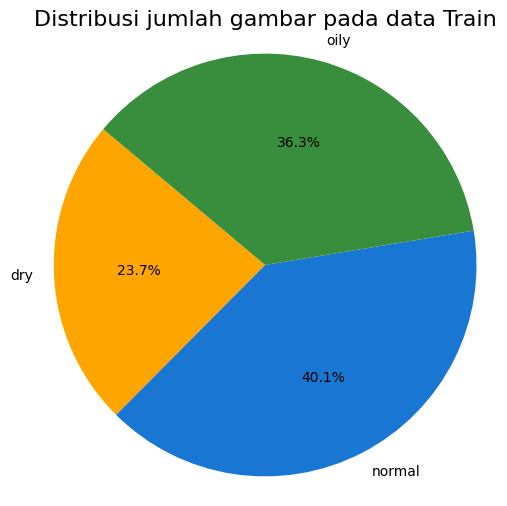

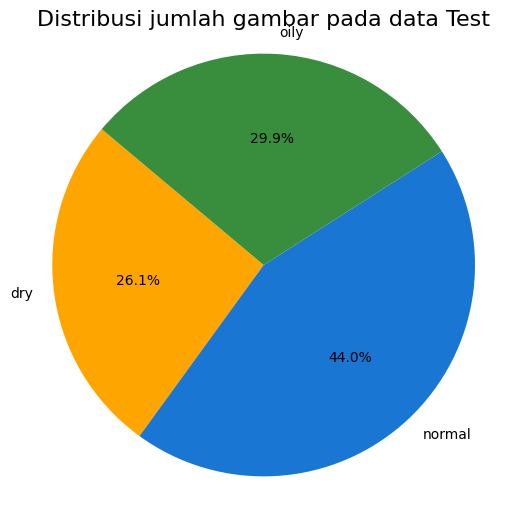

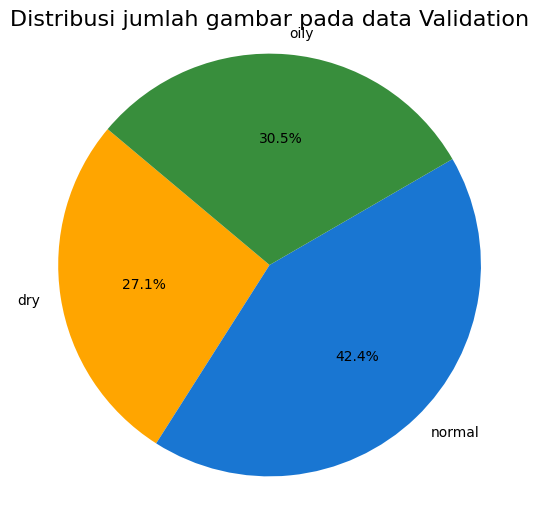

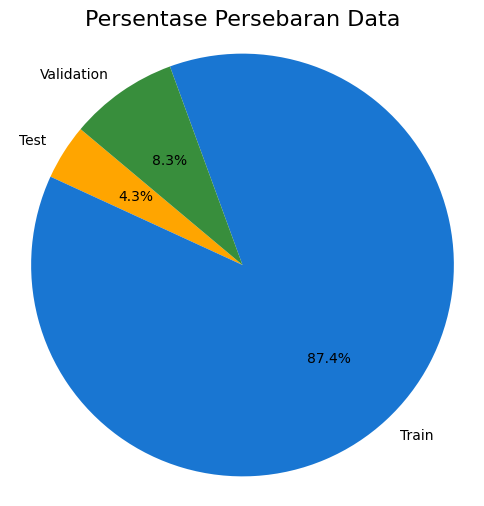

In [23]:
# Kategori
categories = ['dry', 'normal', 'oily']

# Kumpulkan jumlah gambar untuk setiap dataset dan kategori
data1 = []
for dataset_name, folder in zip(['Train', 'Test', 'Validation'], [train_fold, test_fold, val_fold]):
    for category in categories:
        path = os.path.join(folder, category)
        if os.path.exists(path):  # Pastikan path ada
            count = len(os.listdir(path))
            data1.append({'Target': category, 'Jumlah': count, 'Dataset': dataset_name})

# Buat DataFrame
df1 = pd.DataFrame(data1)

# Fungsi untuk plot pie chart
def plot_pie(df_subset, title):
    labels = df_subset['Target'] if 'Target' in df_subset else df_subset['Dataset']
    sizes = df_subset['Jumlah']
    colors = ['orange', '#1976D2', '#388E3C']
    
    plt.figure(figsize=(6, 6))
    plt.pie(sizes, labels=labels, autopct='%1.1f%%', colors=colors[:len(labels)], startangle=140)
    plt.title(title, fontsize=16)
    plt.axis('equal')
    plt.show()

# Plot berdasarkan dataset
if not df1[df1['Dataset'] == 'Train'].empty:
    plot_pie(df1[df1['Dataset'] == 'Train'], "Distribusi jumlah gambar pada data Train")
if not df1[df1['Dataset'] == 'Test'].empty:
    plot_pie(df1[df1['Dataset'] == 'Test'], "Distribusi jumlah gambar pada data Test")
if not df1[df1['Dataset'] == 'Validation'].empty:
    plot_pie(df1[df1['Dataset'] == 'Validation'], "Distribusi jumlah gambar pada data Validation")

# Total distribusi keseluruhan
total_df1 = df1.groupby('Dataset')['Jumlah'].sum().reset_index()
plot_pie(total_df1, "Persentase Persebaran Data")


Berdasarkan grafik di atas, kita dapat menarik beberapa insight sebagai berikut:

1. **Data Training (2756 gambar):**
  - Dry: 23.7%
  - Normal: 40.0%
  - Oily: 36.3%

2. **Data Validasi (262 gambar):**
  - Dry: 27.1%
  - Normal: 42.4%
  - Oily: 30.5%

3. **Data Testing (134 gambar):**
  - Dry: 26.1%
  - Normal: 44.0%
  - Oily: 29.9%

4. **Persentase persebaran data total:**
  - Data Train: 87.4%
  - Data Validasi: 8.31%
  - Data Testing: 4.25%

**TOTAL DATA: 3152**
___

Kita dapat melihat bahwa terdapat ketidakseimbangan data pada dataset training, validasi, dan testing, dimana data train data testing tidak sampai 10%. Hal ini tidak umum digunakan dikarenakan karena dapat mengakibatkan data testing tidak dapat belajar dan berujung overfitting. Setiap klasifikasi tipe wajah juga menunjukan ketidakseimbangan persebaran data yang dapat menimbulkan bias ketika model memprediksi gambar. Maka dari itu, saya akan mengecek masing-masing data pada tahapan Sampling Data untuk mengidentifikasi kondisi data sebenarnya.

**References:**
1. [**Train-Test Split**](https://machinelearningmastery.com/train-test-split-for-evaluating-machine-learning-algorithms/)
2. [**Data Splitting Avoid Overfitting**](https://medium.com/analytics-vidhya/training-neural-networks-for-dummies-04-pt-1-train-validate-test-split-9b1141496c63)

## **II. Sampling Data**

Mengambil beberapa data pada tiap kelas untuk melakukan identifikasi awal terhadap dataset gambar.

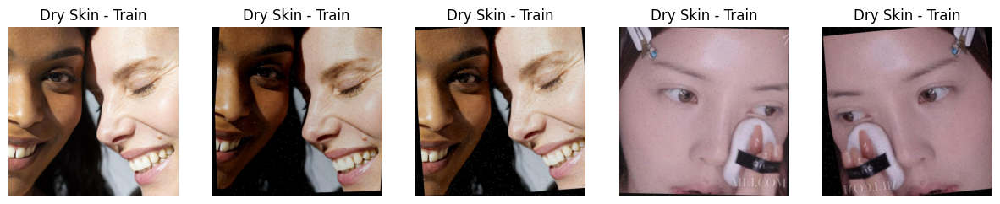

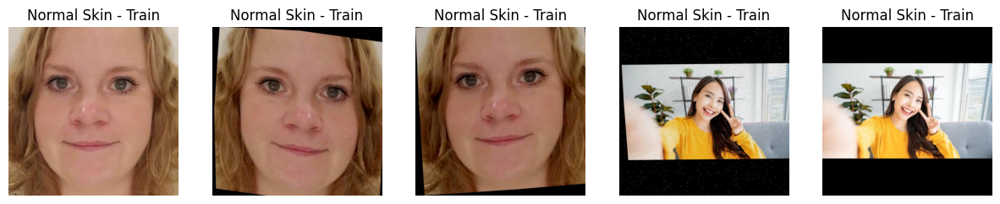

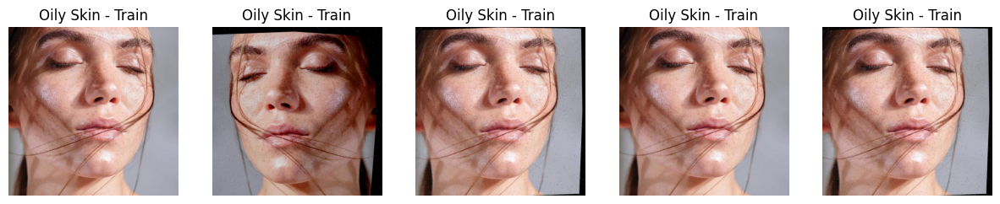

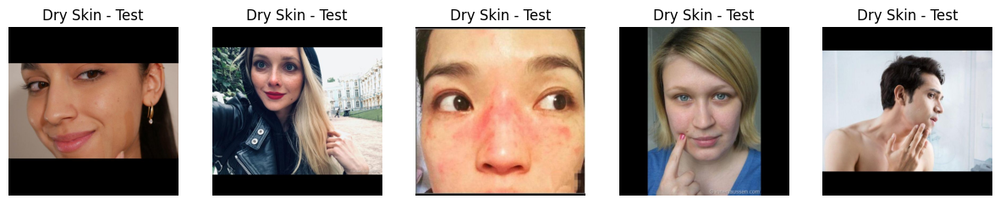

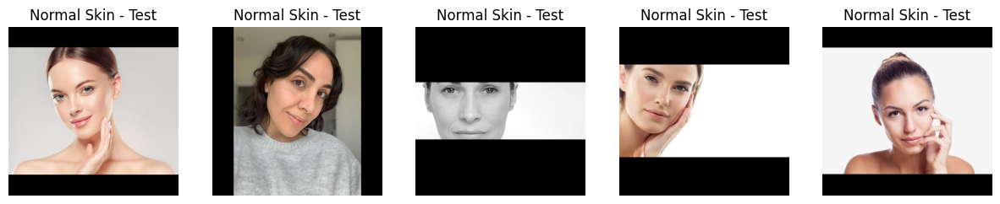

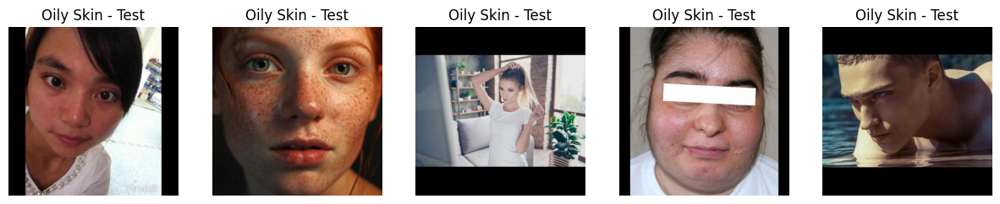

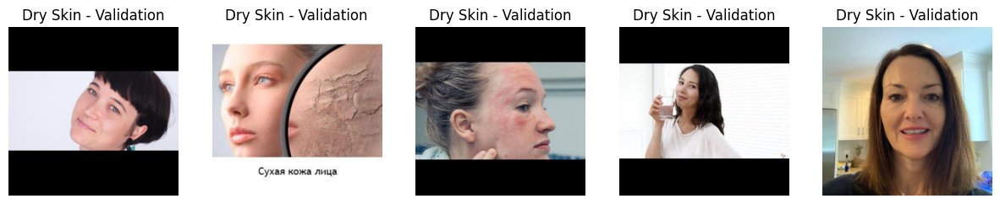

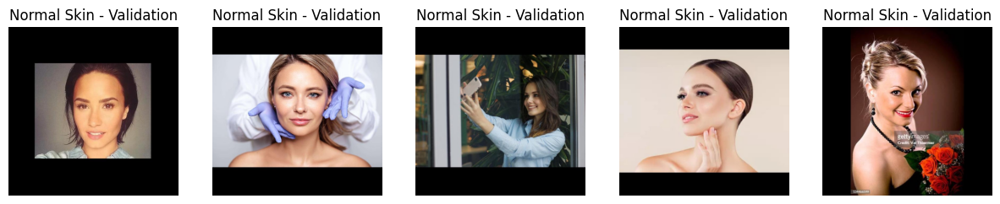

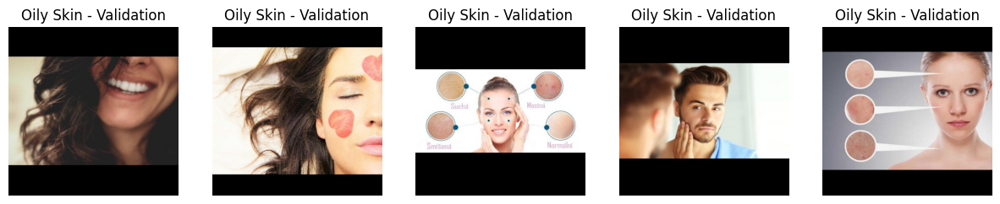

Selected files from train_dry_selected: ['/kaggle/working/oily-dry-and-normal-skin-types-dataset/Oily-Dry-Skin-Types/train/dry/dry_5b0651ccf8c833d44008_jpg.rf.e286b45ce1001076238cd27e5e5ac4c2.jpg', '/kaggle/working/oily-dry-and-normal-skin-types-dataset/Oily-Dry-Skin-Types/train/dry/dry_5b0651ccf8c833d44008_jpg.rf.9a5ecd79a65b2172cf62cefdd04f17b0.jpg', '/kaggle/working/oily-dry-and-normal-skin-types-dataset/Oily-Dry-Skin-Types/train/dry/dry_5b0651ccf8c833d44008_jpg.rf.ddbd91e3ee897f639735bdcf4a9c9331.jpg', '/kaggle/working/oily-dry-and-normal-skin-types-dataset/Oily-Dry-Skin-Types/train/dry/dry_98e5cc0b401cfc75b001_jpg.rf.b3527d701818446569fd933bd593290b.jpg', '/kaggle/working/oily-dry-and-normal-skin-types-dataset/Oily-Dry-Skin-Types/train/dry/dry_98e5cc0b401cfc75b001_jpg.rf.be16095ad750af4a686b8dc4665dd988.jpg']


In [11]:
# Fungsi untuk mengambil file berdasarkan ID yang sama
def get_files_by_id(file_list, max_files=5):
    grouped_files = defaultdict(list)

    # Kelompokkan file berdasarkan ID yang sama
    for file in file_list:
        file_id = '_'.join(file.split('_')[:-1])  # Ambil bagian ID seperti 'normal_0a'
        grouped_files[file_id].append(file)

    # Ambil maksimal max_files gambar dengan ID yang sama
    selected_files = []
    for file_id, files in grouped_files.items():
        selected_files.extend(files[:max_files])

    # Hanya ambil sampai 5 file
    return selected_files[:max_files]

# Fungsi untuk visualisasi gambar
def visualize_img(random_data, labels=None):
    fig, axes = plt.subplots(1, 5, figsize=(15, 12))
    for i, image_path in enumerate(random_data):
        image = plt.imread(image_path)
        axes[i].imshow(image)  # Remove cmap='gray' if you are working with RGB images
        axes[i].set_title(f'{labels}')  # Tidak menampilkan shape
        axes[i].axis('off')
    plt.show()

# Mengambil file berdasarkan ID untuk train, test, dan validation
train_dry_selected = get_files_by_id(train_dry, max_files=5)
train_normal_selected = get_files_by_id(train_normal, max_files=5)
train_oily_selected = get_files_by_id(train_oily, max_files=5)

test_dry_selected = get_files_by_id(test_dry, max_files=5)
test_normal_selected = get_files_by_id(test_normal, max_files=5)
test_oily_selected = get_files_by_id(test_oily, max_files=5)

val_dry_selected = get_files_by_id(val_dry, max_files=5)
val_normal_selected = get_files_by_id(val_normal, max_files=5)
val_oily_selected = get_files_by_id(val_oily, max_files=5)

# Visualisasi gambar berdasarkan dataset yang telah dipilih
visualize_img(train_dry_selected, 'Dry Skin - Train')
visualize_img(train_normal_selected, 'Normal Skin - Train')
visualize_img(train_oily_selected, 'Oily Skin - Train')

visualize_img(test_dry_selected, 'Dry Skin - Test')
visualize_img(test_normal_selected, 'Normal Skin - Test')
visualize_img(test_oily_selected, 'Oily Skin - Test')

visualize_img(val_dry_selected, 'Dry Skin - Validation')
visualize_img(val_normal_selected, 'Normal Skin - Validation')
visualize_img(val_oily_selected, 'Oily Skin - Validation')
print("Selected files from train_dry_selected:", train_dry_selected)

Berdasarkan hasil sampling 5 data pada masing-masing kelas, kita bisa mengidentifikasi bahwa dataset train yang diperoleh dari situs kaggle (Oily, Dry and Normal Skin Types) sudah ter-augmentasi dengan berbagai varian data, mulai dari gambar orisinal, gambar yang ter-warped dengan metode flipping, dan gambar yang telah diubah teksturnya. Hal lain yang dapat diidentifikasi adalah dataset train tidak memiliki unique identifier yang berurutan, yang mana saya secara otomatis tidak dapat memilah data yang telah ter-augmentasi karena tidak ada label spesifik pada data augmentasi. Hal serupa perihal kualitas dataset juga dikemukakan oleh Gaw & Ismail (2024), dimana mereka memproses data yang bersifat **ambigu dan tidak berhubungan atau tidak sesuai** dengan konteks proyek ini, seperti gambar muka yang memiliki produk atau objek yang secara visual tidak berkaitan dengan konteks tipe wajah. Dengan kondisi tersebut, **saya akan memilah secara manual gambar yang bersifat redundan**, atau dengan kata lain menghapus data yang teraugmentasi. Saya juga akan memilah lebih detail perihal data gambar yang **tidak memiliki hubungan terhadap konteks dataset**. Setelah itu, dataset yang telah bersih akan di gabung dan dilakukan proses splitting kembali dengan proporsi 80% data train dan 20% data testing, dimana pada data training akan di split kembali dengan proporsi 70% data train 10% data validasi (Vishal Jain, 2021).

## **III. Data Loading - Cleaned Dataset** 

Pada bagian ini saya akan mengimport data yang telah dipilih secara manual pada *local directory* saya. Setelah itu saya akan mengidentifikasi kembali distribusi dan hasil sampling data pada dataset yang telah bersih.

In [12]:
# Menyalin folder dari /kaggle/input ke /kaggle/working
shutil.copytree('/kaggle/input/cleaneddata', '/kaggle/working/cleaneddata')

# Memastikan bahwa folder berhasil disalin
print(os.listdir('/kaggle/working/'))

['.virtual_documents', 'oily-dry-and-normal-skin-types-dataset', 'cleaneddata']


Melakukan splitting data training, validation, dan testing sesuai ketentuan yang telah saya sampaikan pada tahapan sebelumnya.

In [13]:
# Lokasi folder sumber
source_dir = '/kaggle/working/cleaneddata/CleanedData'
base_output_dir = '/kaggle/working/splitted_data'

# Rasio pembagian data
train_ratio = 0.7
val_ratio = 0.1
test_ratio = 0.2

# Nama folder output yang diinginkan
folder_names = {
    'train': 'train_clean',
    'val': 'val_clean',
    'test': 'test_clean'
}

# Pastikan folder output bersih
for folder in folder_names.values():
    full_path = os.path.join(base_output_dir, folder)
    if os.path.exists(full_path):
        shutil.rmtree(full_path)
    os.makedirs(full_path)

# Ambil setiap kelas dari folder sumber
for class_name in os.listdir(source_dir):
    class_dir = os.path.join(source_dir, class_name)
    if not os.path.isdir(class_dir):
        continue

    # Ambil semua file di dalam kelas
    files = os.listdir(class_dir)
    random.shuffle(files)

    # Hitung jumlah file untuk tiap set
    total = len(files)
    train_end = int(total * train_ratio)
    val_end = train_end + int(total * val_ratio)

    train_files = files[:train_end]
    val_files = files[train_end:val_end]
    test_files = files[val_end:]

    # Fungsi salin file ke target
    def copy_files(file_list, target_key):
        target_folder = folder_names[target_key]
        target_class_dir = os.path.join(base_output_dir, target_folder, class_name)
        os.makedirs(target_class_dir, exist_ok=True)
        for file in file_list:
            shutil.copy(os.path.join(class_dir, file), os.path.join(target_class_dir, file))

    # Salin file ke masing-masing folder
    copy_files(train_files, 'train')
    copy_files(val_files, 'val')
    copy_files(test_files, 'test')

print("Split data selesai ke train_clean, val_clean, dan test_clean!")


Split data selesai ke train_clean, val_clean, dan test_clean!


Menetapkan path yang akan digunakan untuk mengakses data train, validation, dan testing.

In [18]:
# Menetapkan jalur ke folder dataset yang baru
train_fold_clean = os.path.join('/kaggle/working/splitted_data', 'train_clean')
test_fold_clean = os.path.join('/kaggle/working/splitted_data', 'test_clean')
val_fold_clean = os.path.join('/kaggle/working/splitted_data', 'val_clean')

# Menampilkan jalur folder train
print(train_fold_clean)

/kaggle/working/splitted_data/train_clean


Menetapkan kembali path yang akan digunakan untuk mengakses tiap kelas pada data train, validation, dan testing.

In [19]:
# Get image paths for each category (dry, normal, oily) in train, test, and validation datasets
train_dry_clean = glob.glob(train_fold_clean + "/dry/*.[jp][pn]*")  # Match .jpg, .jpeg, .png files
train_normal_clean = glob.glob(train_fold_clean + "/normal/*.[jp][pn]*")
train_oily_clean = glob.glob(train_fold_clean + "/oily/*.[jp][pn]*")

test_dry_clean = glob.glob(test_fold_clean + "/dry/*.[jp][pn]*")
test_normal_clean = glob.glob(test_fold_clean + "/normal/*.[jp][pn]*")
test_oily_clean = glob.glob(test_fold_clean + "/oily/*.[jp][pn]*")

val_dry_clean = glob.glob(val_fold_clean + "/dry/*.[jp][pn]*")
val_normal_clean = glob.glob(val_fold_clean + "/normal/*.[jp][pn]*")
val_oily_clean = glob.glob(val_fold_clean + "/oily/*.[jp][pn]*")
print('Success!')

Success!


Mengambil sampel dataset untuk digunakan pada proses EDA.

In [20]:
# Ambil 5 data pertama dari setiap kategori
sample_dry = train_dry_clean[:5]
sample_normal = train_normal_clean[:5]
sample_oily = train_oily_clean[:5]
sample_dry

['/kaggle/working/splitted_data/train_clean/dry/dry_5b0651ccf8c833d44008_jpg.rf.e286b45ce1001076238cd27e5e5ac4c2.jpg',
 '/kaggle/working/splitted_data/train_clean/dry/dry_54835ffd7900ab7b5083_jpg.rf.f31ddd82f98841c47c8b54a9ba8bdc1e.jpg',
 '/kaggle/working/splitted_data/train_clean/dry/dry_00f1189752d6631b2b22_jpg.rf.971d716704bcf6dd3b46212870333b0b.jpg',
 '/kaggle/working/splitted_data/train_clean/dry/dry_28ed5ad73d24f5b7fb69_jpg.rf.7d0ab7248c7246be95f9216c2f8af6af.jpg',
 '/kaggle/working/splitted_data/train_clean/dry/dry_ded9f7a6131df5bdc061_jpg.rf.18c137878f2604d9716611d01cf514c7.jpg']

Menampilkan kembali distribusi dataset yang telah proses (cleaned).

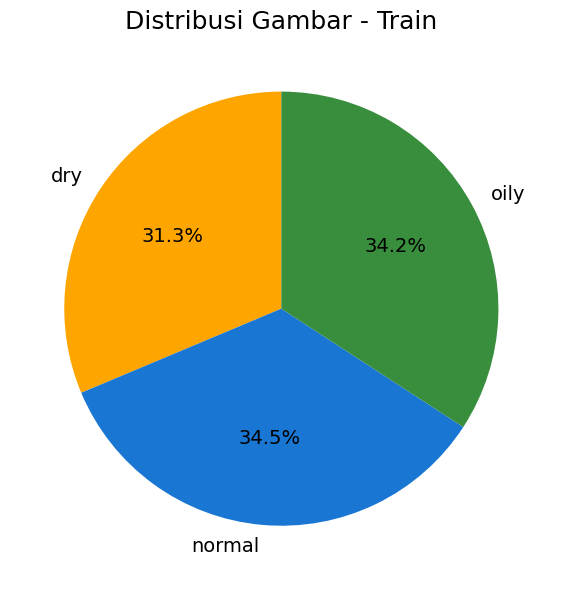

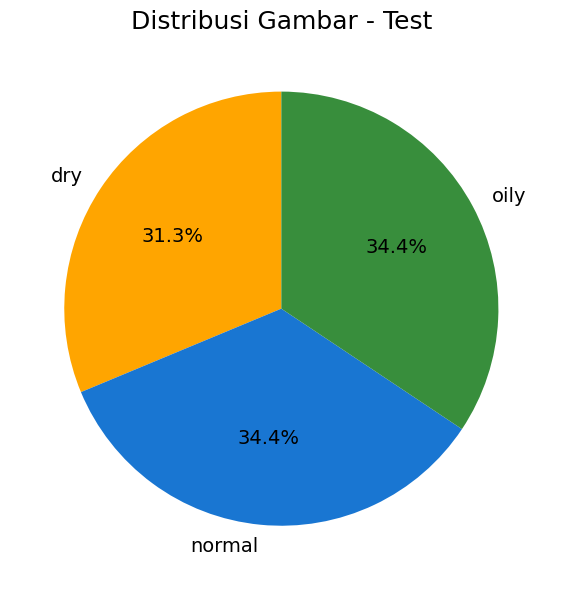

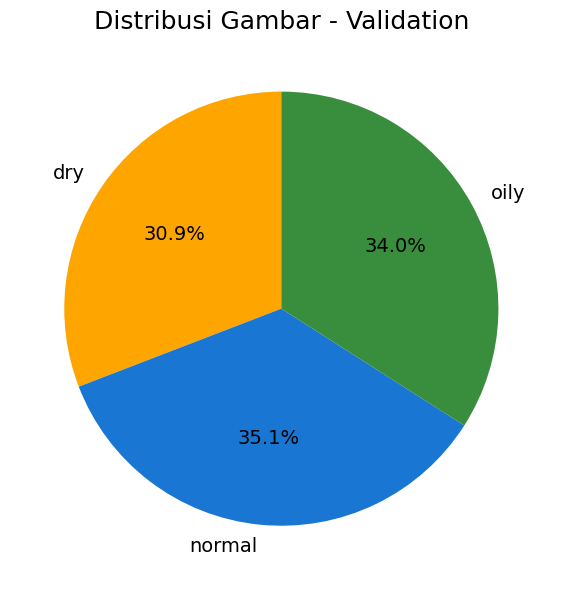

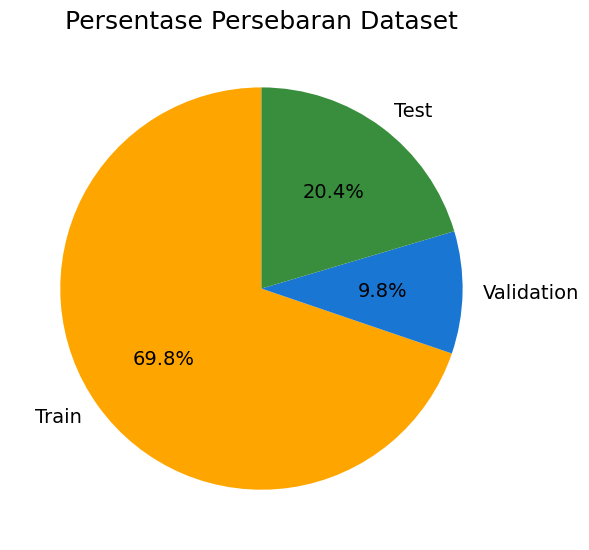

In [10]:
# Daftar kategori tipe wajah
categories = ['dry', 'normal', 'oily']

# Fungsi bantu untuk hitung jumlah gambar per kelas per dataset
def count_images(base_dir):
    return [len(os.listdir(os.path.join(base_dir, cat))) for cat in categories]

# Hitung jumlah gambar
train_counts = count_images(train_fold_clean)
test_counts = count_images(test_fold_clean)
val_counts = count_images(val_fold_clean)

# Gabung semua ke DataFrame
df = pd.DataFrame({
    "Target": categories * 3,
    "Jumlah": train_counts + test_counts + val_counts,
    "Dataset": ["Train"] * 3 + ["Test"] * 3 + ["Validation"] * 3
})

# Fungsi pie chart matplotlib
def plot_pie(data, title, colors):
    plt.figure(figsize=(6, 6))
    plt.pie(data["Jumlah"], labels=data["Target"], autopct='%1.1f%%',
            startangle=90, colors=colors, textprops={'fontsize': 14})
    plt.title(title, fontsize=18)
    plt.tight_layout()
    plt.show()

# Warna per kelas
color_map = {"dry": "orange", "normal": "#1976D2", "oily": "#388E3C"}
pie_colors = [color_map[cat] for cat in categories]

# Pie chart per dataset
plot_pie(df[df["Dataset"] == "Train"], "Distribusi Gambar - Train", pie_colors)
plot_pie(df[df["Dataset"] == "Test"], "Distribusi Gambar - Test", pie_colors)
plot_pie(df[df["Dataset"] == "Validation"], "Distribusi Gambar - Validation", pie_colors)

# Total distribusi Train vs Test vs Validation
total_counts = {
    "Train": sum(train_counts),
    "Validation": sum(val_counts),
    "Test": sum(test_counts)
}

# Plot distribusi dataset total
plt.figure(figsize=(6, 6))
plt.pie(total_counts.values(), labels=total_counts.keys(), autopct='%1.1f%%',
        startangle=90, colors=["orange", "#1976D2", "#388E3C"], textprops={'fontsize': 14})
plt.title("Persentase Persebaran Dataset", fontsize=18)
plt.tight_layout()
plt.show()

Berdasarkan grafik pie chart di atas, kita dapat menyimpulkan beberapa hal penting terkait distribusi data:

1. **Data Training (677 gambar):**
   - Kategori *normal* mendominasi sebesar **34.5%**
   - Disusul *oily* sebanyak **34.2%**
   - Sedangkan *dry* sekitar **31.3%**

2. **Data Testing (195 gambar):**
   - *Normal* dan *oily* masing-masing menyumbang **34.4%**
   - *Dry* sedikit lebih rendah yaitu **31.3%**

3. **Data Validasi (94 gambar):**
   - *Normal* paling tinggi yaitu **35.1%**
   - Diikuti *oily* sebesar **34.0%**
   - *Dry* berada di angka **30.9%**

4. **Persentase Persebaran Data Total:**
   - **Training**: 60.8%
   - **Testing**: 20.4%
   - **Validasi**: 18.8%

**TOTAL DATA CLEANED: 966**

---

Distribusi antar kelas relatif seimbang dengan persebaran yang cukup proporsional jika dibandingkan dengan dataset awal. Jika kita melihat data awal sebanyak **3.152**, data yang berkurang sebanyak **2.186**. Reduksi jumlah data yang digunakan cukup signifikan dan diharapkan dapat membantu pada proses modeling nantinya dengan mencegah data yang tidak layak dan data yang telah teraugmentasi untuk ikut dipelajari oleh model. Hal lain yang juga dapat diidentifikasi, bahwa proporsi awal yang merupakan **70:10:20** tidak sepenuhnya dapat dibulatkan secara persentase karena jumlah data yang beragam dan tersebar pada masing-masing kelas. Perlu diperhatikan bahwa proses pembersihan data hanyalah dengan memilah gambar mana yang sekiranya layak untuk digunakan dalam proses modeling, karena melakukan augmentasi data satu persatu seperti yang disarankan pada artikel [Skin Synthesis](#justifikasi-permasalahan) akan membutuhkan waktu dan proses yang lebih lama. Persebaran dataset ini juga akan memperkecil risiko overfitting dikarenakan model sangat sering memperlajari pola dengan dataset yang cukup besar (sebelumnya data train hampir 90%). Dengan persebaran data tersebut, saya berasumsi bahwa kegiatan EDA dan modeling siap dilakukan. 

## **IV. Image Dimension**

Pengecekan dimensi gambar pada tiap folder train, validation, dan test.

In [22]:
def get_image_shapes(folder_path):
    # Check if the folder exists and list the files inside
    if not os.path.exists(folder_path):
        print(f"Folder not found: {folder_path}")
        return pd.DataFrame()  # Return empty DataFrame if folder doesn't exist
    
    image_info = []
    
    # Walk through all subfolders and files in the folder
    for root, dirs, files in os.walk(folder_path):
        for image_file in files:
            if image_file.endswith('.jpg') or image_file.endswith('.jpeg') or image_file.endswith('.png'):
                # Full path to the image
                image_path = os.path.join(root, image_file)
                
                # Read the image
                img = plt.imread(image_path)
                
                # Get the shape of the image
                img_shape = img.shape
                rgb_channels = img_shape[2] if len(img_shape) == 3 else 'Grayscale'  # RGB or Grayscale
                
                # Collecting image info: name, shape, and RGB channels
                image_info.append({
                    'Image File': image_file,
                    'Folder': root,  # Include the folder name (dry, normal, oily)
                    'Shape': img_shape,
                    'RGB Channels': rgb_channels
                })
    
    # Create a DataFrame to display the results
    df = pd.DataFrame(image_info)
    return df

# Get image shapes for each folder (including subfolders)
train_df = get_image_shapes(train_fold_clean)
test_df = get_image_shapes(test_fold_clean)
val_df = get_image_shapes(val_fold_clean)
train_df.head()

,Image File,Folder,Shape,RGB Channels
0,oily_40c9ee7092ec5884e713_jpg.rf.35d629cbdc8cf...,/kaggle/working/splitted_data/train_clean/oily,"(640, 640, 3)",3
1,oily_3f4dfe94774aa9536338_jpg.rf.867f5838bd6ec...,/kaggle/working/splitted_data/train_clean/oily,"(640, 640, 3)",3
2,oily_698c800767fe8306e48a_jpg.rf.8cce33ef46abb...,/kaggle/working/splitted_data/train_clean/oily,"(640, 640, 3)",3
3,oily_284ef5e1c4821d5bce92_jpg.rf.4fb6a780c5003...,/kaggle/working/splitted_data/train_clean/oily,"(640, 640, 3)",3
4,oily_08b3227e67427708d39f_jpg.rf.f6c0cab17c4d8...,/kaggle/working/splitted_data/train_clean/oily,"(640, 640, 3)",3


In [23]:
shapetrain = train_df['Shape'].value_counts()
shapetest = test_df['Shape'].value_counts()
shapeval = val_df['Shape'].value_counts()

print('===== Image Dimension =====')
print(f'\nTrain set:', shapetrain)
print(f'\nTest set: {shapetest}')
print(f'\nValidation set: {shapeval}')

===== Image Dimension =====

Train set: Shape
(640, 640, 3)    667
Name: count, dtype: int64

Test set: Shape
(640, 640, 3)    195
Name: count, dtype: int64

Validation set: Shape
(640, 640, 3)    94
Name: count, dtype: int64


In [24]:
shapetrain = train_df['RGB Channels'].value_counts()
shapetest = test_df['RGB Channels'].value_counts()
shapeval = val_df['RGB Channels'].value_counts()

print('===== RGB Channels =====')
print(f'\nTrain set {shapetrain}')
print(f'\nTest set: {shapetest}')
print(f'\nValidation set: {shapeval}')

===== RGB Channels =====

Train set RGB Channels
3    667
Name: count, dtype: int64

Test set: RGB Channels
3    195
Name: count, dtype: int64

Validation set: RGB Channels
3    94
Name: count, dtype: int64


Keseluruhan data/gambar pada tiap folder memiliki shape yang konsisten (640x640), sama halnya dengan tipe warna pada data menggunakan color Channel RGB (3 color channel). Untuk itu, data siap dilanjutkan pada proses berikutnya.

## **V. Image Texture**

Mengidentifikasi tekstur gambar untuk mendeteksi jenis kulit dan wajah pada masing-masing kelas. Pada proses ini kita akan mengambil lima sampel data.

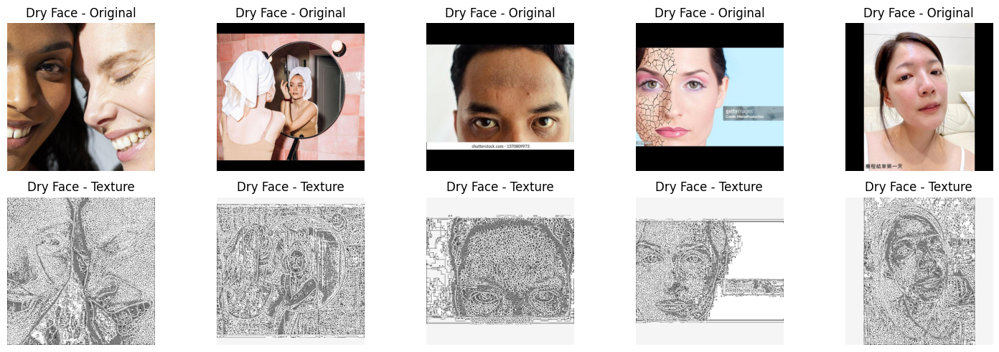

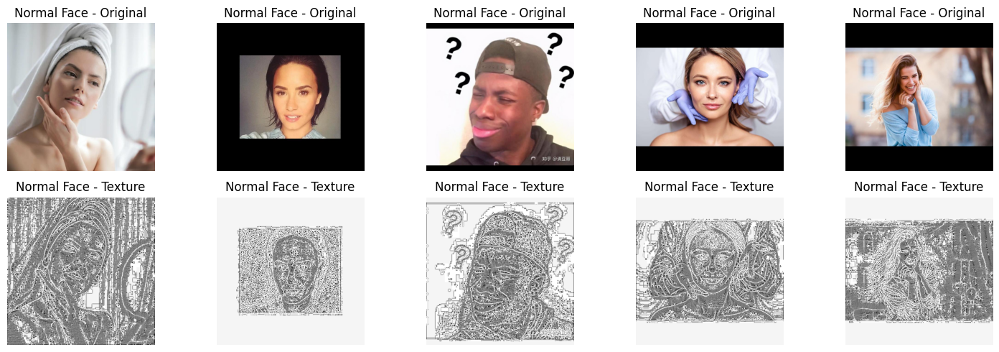

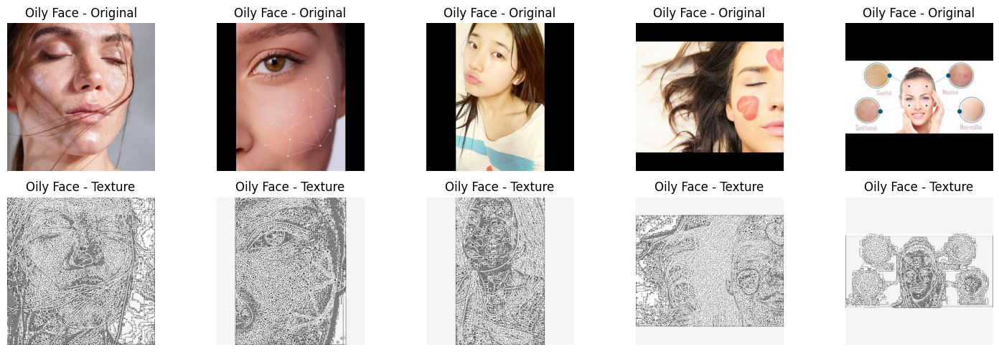

In [25]:
def visualize_img_texture(random_data, label=None, radius=3, n_points=24):
    num_images = len(random_data)
    num_columns = num_images  # One column per image, so they all appear in a single row
    num_rows = 2  # We will have 2 rows: one for original images, one for LBP images

    # Set up a grid with 2 rows and `num_images` columns
    fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 5))  # One row for original, one for LBP
    
    # If only one row, make sure axes is 1D
    if num_rows == 1:
        axes = np.expand_dims(axes, axis=0)
    
    for i, image_path in enumerate(random_data):
        # Read the image and convert to grayscale
        image = io.imread(image_path)
        image_gray = color.rgb2gray(image)  # Convert to grayscale
        
        # Show the original image in the first row
        axes[0, i].imshow(image)
        axes[0, i].set_title(f'{label} - Original')
        axes[0, i].axis('off')

        # Compute Local Binary Pattern (LBP) for the image
        lbp = feature.local_binary_pattern(image_gray, n_points, radius, method='uniform')
        
        # Show the LBP image in the second row
        axes[1, i].imshow(lbp, cmap='gray')
        axes[1, i].set_title(f'{label} - Texture')
        axes[1, i].axis('off')

    plt.tight_layout()
    plt.show()
visualize_img_texture(sample_dry, 'Dry Face')
visualize_img_texture(sample_normal, 'Normal Face')
visualize_img_texture(sample_oily, 'Oily Face')

Berikut hasil analisis tekstur gambar untuk mendeteksi jenis kulit dan tekstur wajah:

**1. Dry (Kulit Kering)**
- **Visual:** Kulit pecah, kusam, kadang mengelupas.
- **Tekstur:** Kasar, tidak rata, garis tebal dan kontras tinggi.
- **Catatan:** Tekstur menunjukkan permukaan yang kering dan retak, terutama di pipi & dahi.

**2. Normal (Kulit Normal)**
- **Visual:** Kulit halus, rata, segar tanpa kilap atau kering.
- **Tekstur:** Halus, merata, garis tipis & noise rendah.
- **Catatan:** Paling stabil dan seimbang dari segi visual & tekstur.

**3. Oily (Kulit Berminyak)**
- **Visual:** Mengilap di T-zone, pori besar, pantulan cahaya jelas.
- **Tekstur:** Padat, kompleks, banyak noise & pola berulang.
- **Catatan:** Tekstur menonjolkan kilap dan distribusi pori.

**Kesimpulan:**

Kulit kering cenderung memiliki tekstur yang kasar dan merata. Untuk kulit normal memiliki tekstur yang stabil dan bersih. Selain itu, kulit berminyak memiliki tekstur padat yang mengakibatkan gambar memiliki banyak noise. 


## **VI. Image Color Distribution**

Mengidentifikasi distribusi warna berdasarkan color channel RGB pada dataset. Pada proses ini kita akan mengambil sampel lima data pada masing-masing kelas.

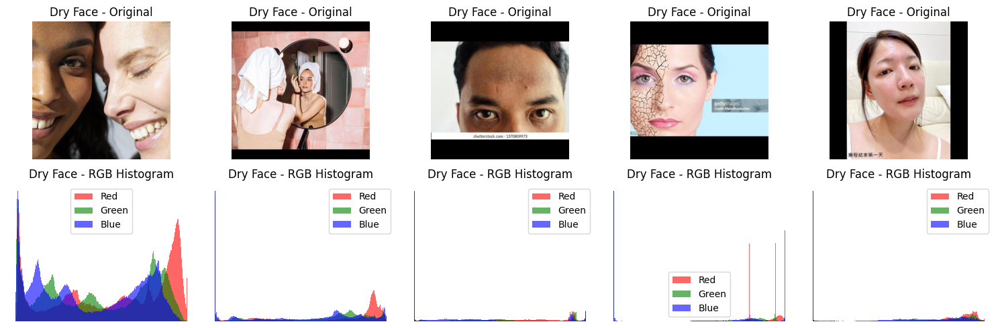

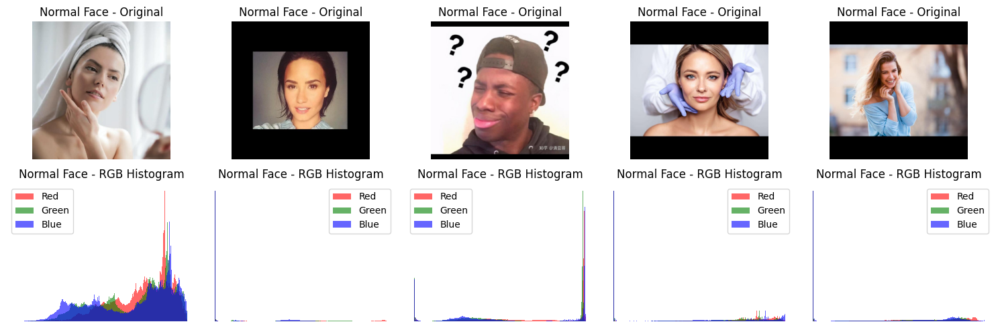

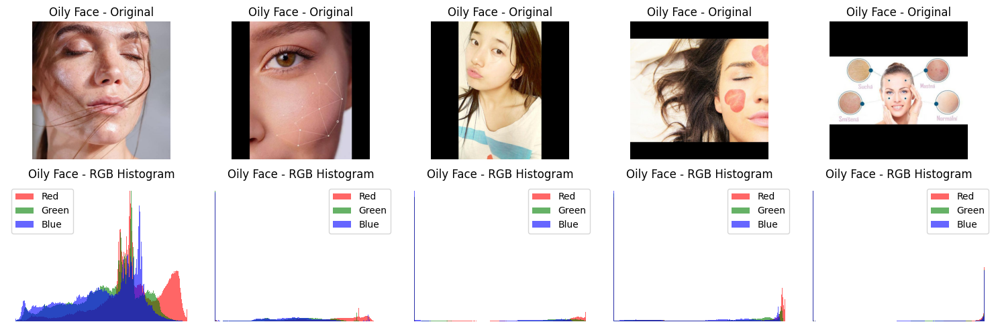

In [26]:
def visualize_img_rgb_dist(random_data, label=None, bins=256):
    num_images = len(random_data)
    num_columns = num_images  # One column per image, so they all appear in a single row
    num_rows = 2  # We will have 2 rows: one for original images, one for RGB histograms

    # Set up a grid with 2 rows and `num_images` columns
    fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 5))  # One row for original, one for histogram
    
    # If only one row, make sure axes is 1D
    if num_rows == 1:
        axes = np.expand_dims(axes, axis=0)
    
    for i, image_path in enumerate(random_data):
        # Read the image
        image = io.imread(image_path)
        
        # Show the original image in the first row
        axes[0, i].imshow(image)
        axes[0, i].set_title(f'{label} - Original')
        axes[0, i].axis('off')

        # Compute the RGB histogram for the image
        # Separate the image into its RGB channels
        r, g, b = image[:,:,0], image[:,:,1], image[:,:,2]
        
        # Compute histograms for each channel (Red, Green, Blue)
        r_hist, r_bins = np.histogram(r, bins=bins, range=(0, 255))
        g_hist, g_bins = np.histogram(g, bins=bins, range=(0, 255))
        b_hist, b_bins = np.histogram(b, bins=bins, range=(0, 255))

        # Create an RGB histogram plot
        hist_rgb = np.zeros((bins, 3), dtype=int)
        hist_rgb[:, 0] = r_hist
        hist_rgb[:, 1] = g_hist
        hist_rgb[:, 2] = b_hist
        
        # Show the RGB histogram in the second row
        axes[1, i].bar(r_bins[:-1], hist_rgb[:, 0], color='r', alpha=0.6, label="Red")
        axes[1, i].bar(g_bins[:-1], hist_rgb[:, 1], color='g', alpha=0.6, label="Green")
        axes[1, i].bar(b_bins[:-1], hist_rgb[:, 2], color='b', alpha=0.6, label="Blue")
        
        axes[1, i].set_title(f'{label} - RGB Histogram')
        axes[1, i].legend()
        axes[1, i].axis('off')

    plt.tight_layout()
    plt.show()
    
visualize_img_rgb_dist(sample_dry, 'Dry Face')
visualize_img_rgb_dist(sample_normal, 'Normal Face')
visualize_img_rgb_dist(sample_oily, 'Oily Face')

Berikut hasil analisis terkait histogram distribusi RGB di atas: 

**1. Dry:**
- Merah dominan, biru & hijau lemah.
- Histogram tidak merata, banyak spike.
- Kontras tinggi, warna cenderung kusam.

**2. Normal:**
- RGB seimbang & merata.
- Warna kulit natural, tidak overexposed.
- Histogram paling stabil.

**3. Oily:**
- Dominan di area terang (kanan).
- Biru & merah kuat, akibat pantulan cahaya.
- Histogram menunjukkan overexposure ringan.

**Kesimpulan:**

Untuk kulit wajah Dry distribusi warna RGB tidak seimbang dan memiliki kontras yang tinggi, terlihat pula distribusinya memiiliki distribusi dengan spike yang mencolok pada titik-titik tertentu. Untuk kulit wajah Normal cenderung memiliki warna yang seimbang dengan distribusi yang moderat. Untuk kulit wajah Oily condong memiliki RGB yang lebih terang dengan distribusi yang cukup normal namun memiliki spike yang cukup tinggi pada kurva tertentu.

## **VII. Image Brightness & Contrast**

Mengidentifikasi distribusi pencahayaan dan nilai kontras pada dataset. Pada proses ini kita akan mengambil sampel lima data pada masing-masing kelas.

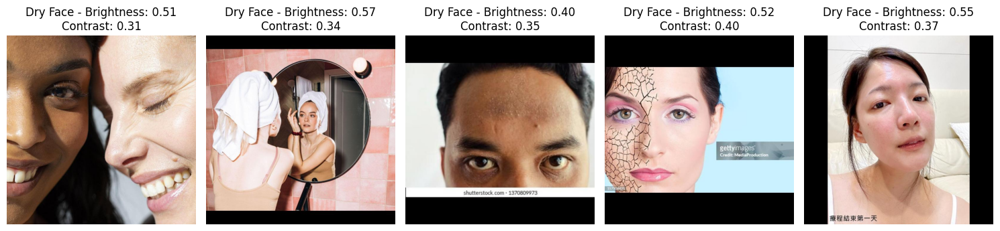

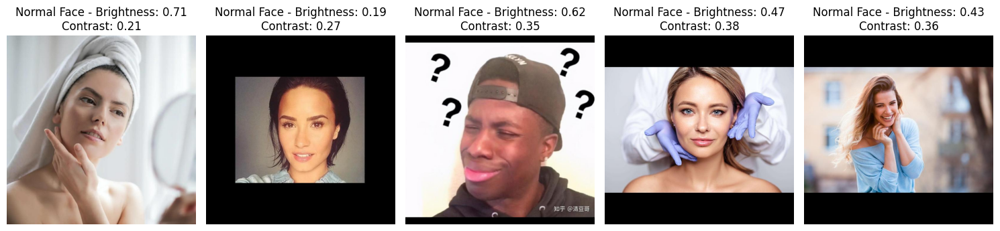

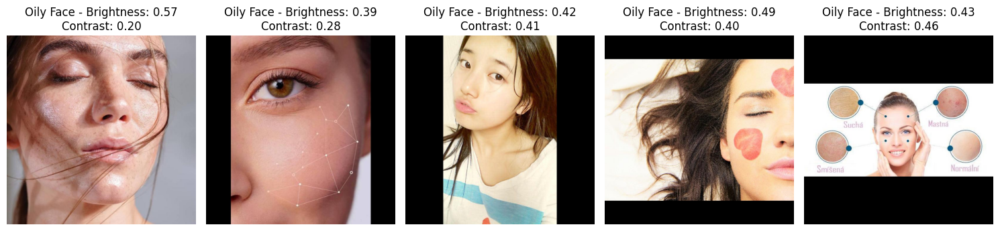

In [27]:
def visualize_img_bri_cont(random_data, label=None):
    # Create a single figure for the images
    num_images = len(random_data)
    
    fig, axes = plt.subplots(1, num_images, figsize=(15, 5))  # 1 row, num_images columns
    
    # If only one image, make sure axes is 1D
    if num_images == 1:
        axes = np.expand_dims(axes, axis=0)

    for i, image_path in enumerate(random_data):
        # Read the image
        image = io.imread(image_path)
        
        # Show the original image (no contrast modification)
        axes[i].imshow(image)
        
        # Convert image to grayscale for brightness and contrast computation
        gray_image = color.rgb2gray(image)
        
        # Compute the contrast (standard deviation of pixel intensities)
        contrast = np.std(gray_image)
        
        # Compute the brightness level (average pixel intensity)
        brightness = np.mean(gray_image)
        
        # Set the title with brightness and contrast information
        axes[i].set_title(f'{label} - Brightness: {brightness:.2f}\nContrast: {contrast:.2f}')
        axes[i].axis('off')  # Turn off axis

    plt.tight_layout()
    plt.show()

visualize_img_bri_cont(sample_dry, 'Dry Face')
visualize_img_bri_cont(sample_normal, 'Normal Face')
visualize_img_bri_cont(sample_oily, 'Oily Face')

**Berikut hasil analisis pencahayaan dan kontras gambar pada dataset di atas:** 

**1. Dry Face**
- Brightness: Rata-rata sedang (0.40–0.57)
- Contrast: Moderat (0.31–0.40)
- Wajah tampak jelas, namun cenderung kontras ringan → cocok untuk menampilkan kekasaran kulit.

**2. Normal Face**
- Brightness: Variatif (0.19–0.71)
- Contrast: Umumnya rendah–sedang (0.21–0.38)
- Citra cenderung natural, terang namun tetap soft → cocok dengan karakter kulit seimbang.

**3. Oily Face**
- Brightness: Rendah–sedang (0.39–0.57)
- Contrast: Cenderung tinggi (0.28–0.46)
- Citra tampak mengilap & tajam → mendukung kesan pantulan minyak.

**Kesimpulan**

Untuk kulit Dry memiliki pencahayaan yang cukup terang dengan wajah yang jelas. Namun hal ini juga diakibatkan oleh gambar sekitar objek wajah. Untuk kulit Normal memiliki pencahayaan yang bervariasi namun dengan kontras yang ringan. Untuk kulit Oily memiliki kecenderungan pada brightness yang tajam, sesuai dengan hasil identifikasi RGB pada poin sebelumnya.

## **VIII. Overfiew of Image Dataset Metrics**

Menampilkan informasi gambar dataset dari masing-masing kelas pada metrik warna (RGB), pencahayaan (Brightness), kontras (Contrast), dan tekstur.

In [ ]:
def image_info(train_dry_clean, train_oily_clean, train_normal_clean, test_dry_clean, test_oily_clean, test_normal_clean, val_dry_clean, val_oily_clean, val_normal_clean):
    # Initialize an empty list to store metrics data
    data = []

    def compute_class_metrics(image_paths):
        # Initialize lists to store metrics for each image in the class
        avg_rgb_list = []
        brightness_list = []
        contrast_list = []
        texture_list = []

        # Loop through each image path in the dataset
        for image_path in image_paths:
            # Read the image
            image = io.imread(image_path)
            
            # Convert image to grayscale for brightness and contrast computation
            gray_image = color.rgb2gray(image)
            
            # Compute the average RGB values (mean across height and width)
            avg_rgb = np.mean(image, axis=(0, 1))  # (R, G, B)
            
            # Compute brightness (mean pixel intensity in grayscale)
            brightness = np.mean(gray_image)
            
            # Compute contrast (standard deviation of pixel intensities in grayscale)
            contrast = np.std(gray_image)
            
            # Compute texture using Local Binary Pattern (LBP)
            radius = 3
            n_points = 24
            lbp = local_binary_pattern(gray_image, n_points, radius, method='uniform')
            texture = np.mean(lbp)  # Mean of the LBP image (texture feature)
            
            # Append the metrics to the respective lists
            avg_rgb_list.append(avg_rgb)
            brightness_list.append(brightness)
            contrast_list.append(contrast)
            texture_list.append(texture)

        # Compute the average and standard deviation for each metric across all images in the class
        avg_rgb = np.mean(avg_rgb_list, axis=0)
        std_rgb = np.std(avg_rgb_list, axis=0)  # Standard deviation for RGB
        avg_brightness = np.mean(brightness_list)
        std_brightness = np.std(brightness_list)  # Standard deviation for brightness
        avg_contrast = np.mean(contrast_list)
        std_contrast = np.std(contrast_list)  # Standard deviation for contrast
        avg_texture = np.mean(texture_list)
        std_texture = np.std(texture_list)  # Standard deviation for texture

        return avg_rgb, std_rgb, avg_brightness, std_brightness, avg_contrast, std_contrast, avg_texture, std_texture

    # Define dataset categories: dry, normal, oily for each set (train, test, val)
    datasets = {
        'Train': {
            'Dry': train_dry_clean,
            'Normal': train_normal_clean,
            'Oily': train_oily_clean
        },
        'Test': {
            'Dry': test_dry_clean,
            'Normal': test_normal_clean,
            'Oily': test_oily_clean
        },
        'Val': {
            'Dry': val_dry_clean,
            'Normal': val_normal_clean,
            'Oily': val_oily_clean
        }
    }

    # Loop over the datasets and compute metrics for each class in each dataset
    for dataset_name, classes in datasets.items():
        for class_name, image_paths in classes.items():
            avg_rgb, std_rgb, avg_brightness, std_brightness, avg_contrast, std_contrast, avg_texture, std_texture = compute_class_metrics(image_paths)
            
            # Append the results to the data list
            data.append({
                'Dataset': dataset_name,
                'Class': class_name,
                'Avg RGB': avg_rgb,
                'Std RGB': std_rgb,
                'Avg Brightness': avg_brightness,
                'Std Brightness': std_brightness,
                'Avg Contrast': avg_contrast,
                'Std Contrast': std_contrast,
                'Avg Texture': avg_texture,
                'Std Texture': std_texture
            })

    # Create a DataFrame from the collected data
    df = pd.DataFrame(data)
    
    # Return the resulting DataFrame
    return df

In [5]:
df_info_class = image_info(train_dry_clean, train_oily_clean, train_normal_clean, test_dry_clean, test_oily_clean, test_normal_clean, val_dry_clean, val_oily_clean, val_normal_clean)

df_info_class

,Dataset,Class,Avg RGB,Std RGB,Avg Brightness,Std Brightness,Avg Contrast,Std Contrast,Avg Texture,Std Texture
0,Train,Dry,"[119.8457633541418, 102.52323717619244, 94.882...","[32.22676892794322, 29.05745112389687, 29.1285...",0.414327,0.114904,0.301937,0.061981,18.743324,1.406462
1,Train,Normal,"[117.83606406037713, 101.86472117017661, 94.02...","[38.42089773907408, 35.243184695630326, 34.414...",0.410564,0.139158,0.307179,0.068611,19.143868,1.548409
2,Train,Oily,"[123.24180329975324, 104.84955146655705, 96.20...","[37.72862455590045, 33.92060154735539, 33.6926...",0.424057,0.134674,0.303775,0.068685,18.992860,1.482889
3,Test,Dry,"[118.59455338274844, 101.02642013799945, 93.11...","[33.07719123835131, 31.684185926748942, 32.385...",0.408586,0.123661,0.304183,0.061721,18.912465,1.624784
4,Test,Normal,"[116.00164532561801, 101.17912328008396, 93.85...","[38.28468522534796, 32.28515949778908, 31.2715...",0.407062,0.129813,0.314827,0.061742,19.083805,1.628035
5,Test,Oily,"[114.5019915680387, 99.1062750699627, 90.51795...","[42.72657115522906, 38.87162352195487, 37.3924...",0.399054,0.154278,0.311476,0.070329,19.528615,1.358271
6,Val,Dry,"[118.87628308526402, 103.93299333243534, 96.83...","[37.1215890367107, 31.13042326806608, 29.88138...",0.418026,0.125848,0.298923,0.062411,18.703925,1.363746
7,Val,Normal,"[114.81086632930867, 98.24953990589489, 88.161...","[35.26129433261119, 33.27447409121965, 31.8614...",0.396241,0.130531,0.310843,0.067920,19.161328,1.170833
8,Val,Oily,"[115.85687515258789, 99.26767242431642, 89.542...","[31.44286654653741, 26.63189427946048, 26.9926...",0.400360,0.107123,0.314950,0.064080,19.105742,1.502435


Berikut interpretasi yang dapat saya berikan berdasarkan hasil perhitungan rata-rata dan standar deviasi terhadap dataset tipe wajah:

| Dataset | Class  | Interpretasi RGB               | Interpretasi Brightness         | Interpretasi Contrast   | Interpretasi Texture            |
| ------- | ------ | ------------------------------ | ------------------------------- | ----------------------- | ------------------------------- |
| Train   | Dry    | Warna sedang, mendekati netral | Tingkat pencahayaan sedang      | Kontras seimbang        | Tekstur rata-rata               |
| Train   | Normal | Warna sedikit lebih redup      | Paling rendah, cenderung gelap  | Kontras rata-rata       | Tekstur paling tinggi (kasar)   |
| Train   | Oily   | Warna paling terang            | Paling terang (pantulan tinggi) | Kontras rata-rata       | Tekstur sedang                  |
| Test    | Dry    | Warna sedang                   | Medium brightness               | Kontras stabil          | Tekstur sedang                  |
| Test    | Normal | Warna paling gelap             | Cenderung paling redup          | Kontras stabil          | Tekstur paling tinggi           |
| Test    | Oily   | Masih lebih terang dari normal | Medium ke bawah                 | Kontras tetap konsisten | Tekstur tinggi                  |
| Val     | Dry    | Warna sedang (tidak dominan)   | Pencahayaan sedang              | Kontras normal          | Tekstur sedang                  |
| Val     | Normal | Warna paling rendah di RGB     | Paling redup (gelap)            | Kontras cukup tinggi    | Tekstur paling kasar            |
| Val     | Oily   | Masih cenderung terang         | Medium brightness               | Kontras konsisten       | Tekstur lebih halus dari normal |


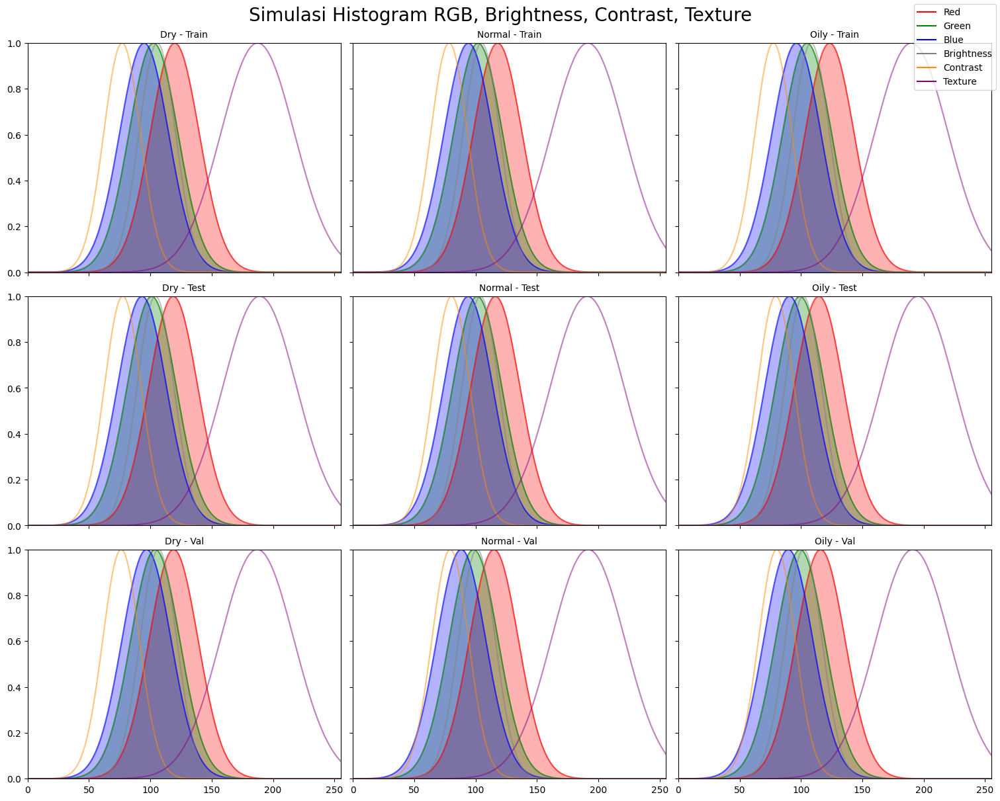

In [ ]:
# Step 1: Perbaiki format RGB agar bisa diolah
def fix_rgb_string(rgb_string):
    if isinstance(rgb_string, list):
        return rgb_string
    fixed = re.sub(r'(?<=\d)\s+(?=\d)', ', ', str(rgb_string))
    return eval(fixed)

# Terapkan konversi ke kolom RGB
df_info_class['Avg RGB'] = df_info_class['Avg RGB'].apply(fix_rgb_string)
df_info_class[['Avg R', 'Avg G', 'Avg B']] = pd.DataFrame(df_info_class['Avg RGB'].tolist(), index=df_info_class.index)

# Step 2: Siapkan kombinasi dataset dan class
datasets = df_info_class['Dataset'].unique()
classes = df_info_class['Class'].unique()

# Step 3: Buat grid subplot (baris = dataset, kolom = class)
n_rows = len(datasets)
n_cols = len(classes)

fig, axs = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows), constrained_layout=True)
fig.suptitle("Simulasi Histogram RGB, Brightness, Contrast, Texture", fontsize=20)

for i, dataset in enumerate(datasets):
    for j, label in enumerate(classes):
        subset = df_info_class[(df_info_class['Dataset'] == dataset) & (df_info_class['Class'] == label)]

        ax = axs[i, j] if n_rows > 1 else axs[j]

        if subset.empty:
            ax.axis('off')
            continue

        # RGB Simulation
        r_avg, g_avg, b_avg = subset[['Avg R', 'Avg G', 'Avg B']].values[0]
        bins = np.arange(256)
        r_hist = np.exp(-0.5 * ((bins - r_avg) / 20) ** 2)
        g_hist = np.exp(-0.5 * ((bins - g_avg) / 20) ** 2)
        b_hist = np.exp(-0.5 * ((bins - b_avg) / 20) ** 2)
        r_hist /= r_hist.max()
        g_hist /= g_hist.max()
        b_hist /= b_hist.max()
        ax.plot(bins, r_hist, color='red', alpha=0.6)
        ax.plot(bins, g_hist, color='green', alpha=0.6)
        ax.plot(bins, b_hist, color='blue', alpha=0.6)
        ax.fill_between(bins, r_hist, color='red', alpha=0.3)
        ax.fill_between(bins, g_hist, color='green', alpha=0.3)
        ax.fill_between(bins, b_hist, color='blue', alpha=0.3)

        # Brightness Simulation
        brightness_avg = subset['Avg Brightness'].values[0]
        b_bins = np.linspace(0, 255, 256)
        b_hist = np.exp(-0.5 * ((b_bins - brightness_avg*255) / 15) ** 2)
        b_hist /= b_hist.max()
        ax.plot(b_bins, b_hist, color='gray', alpha=0.5)

        # Contrast Simulation
        contrast_avg = subset['Avg Contrast'].values[0]
        c_bins = np.linspace(0, 255, 256)
        c_hist = np.exp(-0.5 * ((c_bins - contrast_avg*255) / 15) ** 2)
        c_hist /= c_hist.max()
        ax.plot(c_bins, c_hist, color='darkorange', alpha=0.5)

        # Texture Simulation
        texture_avg = subset['Avg Texture'].values[0]
        t_bins = np.linspace(0, 255, 256)
        t_hist = np.exp(-0.5 * ((t_bins - texture_avg*10) / 30) ** 2)
        t_hist /= t_hist.max()
        ax.plot(t_bins, t_hist, color='purple', alpha=0.5)

        ax.set_title(f"{label} - {dataset}", fontsize=10)
        ax.set_xlim(0, 255)
        ax.set_ylim(0, 1)
        ax.label_outer()

# Tambahkan legend manual sekali
handles = [
    plt.Line2D([0], [0], color='red', label='Red'),
    plt.Line2D([0], [0], color='green', label='Green'),
    plt.Line2D([0], [0], color='blue', label='Blue'),
    plt.Line2D([0], [0], color='gray', label='Brightness'),
    plt.Line2D([0], [0], color='darkorange', label='Contrast'),
    plt.Line2D([0], [0], color='purple', label='Texture')
]
fig.legend(handles=handles, loc='upper right', fontsize=10)

plt.show()


Berdasarkan hasil tabulasi keseluruhan variabel dan grafik distribusi di atas, saya merangkum informasi per variabel EDA pada tabel di bawah ini:

| Variabel       | Kelas Paling Menonjol | Rata-rata (Mean)               | Standar Deviasi (Std)        | Keterangan                                     |
| -------------- | -------------------- | ------------------------------ | ---------------------------- | -------------------------------------------------------- |
| **RGB**        | Oily                 | R ≈ 118.9, G ≈ 101.2, B ≈ 93.2 | R ≈ 36.7, G ≈ 32.6, B ≈ 31.8 | Distribusi warna paling menonjol pada kelas **Oily**. Saya berasumsi kelas tersebut menunjukan gambar yang paling terang dikarenakan gambar menunjukan muka yang mengkilap, mengakibatkan pixel memberikan memberikan value yang tinggi. |
| **Brightness** | Oily                 | 0.410 – 0.424                  | ±0.13                        | Kecerahan gambar paling menonkol pada kelas **Oily**. Kecerahan gambar dengan value RGB yang tinggi secara linear akan meningkatkan kecerahan gambar.              |
| **Contrast**   | Tidak signifikan     | 0.30 – 0.31                    | ±0.06 – 0.07                 | Value contrast pada setiap kelas terdistribusi **merata**, terlihat pada rata-rata dan distribusi standar deviasi yang cenderung konstan.     |
| **Texture**    | Normal               | 19.1                           | ±1.5                         | Kelas **Normal** memiliki nilai tekstur yang paling tinggi. Hal ini menunjukan kulit yang lebih kasar/berpori jika kita tidak memperhitungkan kualitas gambar.              |

**Kesimpulan:**

Hasil analisis terhadap empat aspek tersebut menjadi informasi penting untuk mengidentifikasi bagaimana persebaran data dari keempat variabel dapat mempengaruhi proses modeling selanjutnya dalam proses Feature Engineering. Namun, seperti yang sudah dikatakan sebelumnya, kualitas gambar sangat mempengaruhi persebaran warna, pencahayaan, dan kontras gambar dengan contoh salah satu data gambar di atas yang memiliki padding hitam disekeliling objek utama; wajah manusia. Maka dari itu, pada proses Feature Engineering, kami akan melakukan beberapa *adjusment* seperti augmentasi zoom yang cukup signifikan terhadap objek muka yang terpengaruh oleh padding hitam dari dataset original. Selain itu, kami juga mempertimbangkan untuk tidak mengubah gambar dari segi RGB, dikarenakan hasil gambar yang diterima sudah buruk dan jika dilakukan augmentasi tambahan akan merusak hasil pola kulit itu sendiri. Artikel yang dikemukakan oleh Hu et al. (2019) menyebutkan bahwa lebih baik menggunakan augmentasi yang mengubah geometri daripada mengubah warna atau pencahayaan. Namun, kami kembali berkaca pada kondisi dataset yang sangat buruk, dimana walaupun format gambar **memiiliki shape yang konsisten** (640 x640), objek wajah sesungguhnya dan padding warna hitam **tidak memiliki letak dan bentuk yang konsisten** sepanjang kami mengidentifikasi data secara manual pada direktori. Maka dari itu, akan lebih berisiko untuk mengubah bentuh geometri gambar karena model mempelajari model dengan pola yang tidak beraturan. Alasan lain untuk tidak mengubah warna, dikarenakan  memberikan warna yang kompleks akan menjadikan model mempelajari warna yang salah dari data aslinya, yang dapat mengaikabtkan model menjadi *overfit*. 

**Referensi:**
- [**A Preliminary Study on Data Augmentation of Deep Learning for Image Classification**](https://arxiv.org/pdf/1906.11887)


# **E. FEATURE ENGINEERING**
___
Proses ini akan mengimplementasi hasil EDA sebelumnya untuk kemudian diaugmentasi. Beberapa dataset hasil augmentasi juga ditampilkan sebagai contoh sebelum masuk ke proses modeling. Menurut artikel yang dikemukakan oleh [Chouhan dan Patel](#justifikasi-permasalahan) (2024), augmentasi pada dataset tipe wajah dapat menggunakan scaling (normalisasi), pengaturan warna dan augmentasi geometris untuk memperkaya dataset. Namun berdasarkan argumen kami setelah melakukan proses EDA pada tahap sebelumnya, hanya scaling, zoom, dan pengaturan cahaya (brightness) yang akan dilakukan pada proses augmentasi di tahap Feature Engineering.

Found 667 images belonging to 3 classes.
Found 94 images belonging to 3 classes.
Found 195 images belonging to 3 classes.


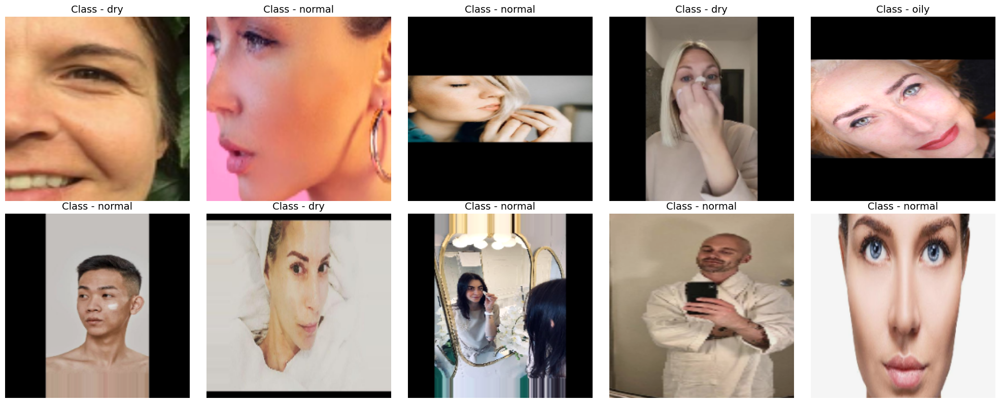

In [ ]:

# Konfigurasi gambar
img_height = 224
img_width = 224
batch_size = 32  # Bikin stabil, jangan terlalu besar

imgen3 = ImageDataGenerator(
    rescale=1./255,
    zoom_range=0.6,
    brightness_range=[0.9, 1.1]
)

test_datagen = ImageDataGenerator(rescale=1./255.)

# Generator training
train3 = imgen3.flow_from_directory(
    train_fold_clean,
    target_size=(img_height, img_width),
    class_mode='sparse',
    shuffle=True,
    batch_size=batch_size,
    seed=2
)

# Generator validasi (bisa pakai imgen3 atau normal saja)
val3 = imgen3.flow_from_directory(
    val_fold_clean,
    target_size=(img_height, img_width),
    class_mode='sparse',
    shuffle=False,
    batch_size=batch_size,
    seed=2
)

# Generator test (hanya normalisasi)
test3 = test_datagen.flow_from_directory(
    test_fold_clean,
    target_size=(img_height, img_width),
    class_mode='sparse',
    shuffle=False,
    batch_size=batch_size,
    seed=2
)
# Preview 10 gambar dari training
batch_images, batch_labels = next(train3)  # Ambil 1 batch random

class_names = list(train3.class_indices.keys())

# Buat plot
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
for i, ax in enumerate(axes.flat):
    if i >= len(batch_images): break
    img = (batch_images[i] * 255).astype(np.uint8)
    label = int(batch_labels[i])
    ax.imshow(img)
    ax.set_title(f'Class - {class_names[label]}', fontsize=14)
    ax.axis('off')

plt.tight_layout()
plt.show()


Berikut penjelasan dari masing-masing objek yang digunakan dalam proses **feature engineering**:

1. Shape img_height dan img_widht menggunakan value 224 pixel sebagai input layer CNN standar.
2. Menggunakan batch_size sebesar 32 agar model lebih beragam dalam mempelajari model pada layer.
3. Menggunakan zoom_range dengan nilai lebih dari 0.5 agar model dapat terfokus mendeteksi wajah.
4. Sebagai tindak lanjutan dari hasil EDA, kami tidak mengaugmentasi RGB gambar namun mempertajam kualitas gambar dengan menyesuaiakn pencahayaan (brightness) sebesar 90% lebih gelap dan 110% lebih terang dari gambar aslinya
5. Melakukan normalisasi gambar pada setiap pixel dengan nilai 1-256 pada color channel RGB. Untuk dataset testing, hal ini merupakan perubahan satu-satunya yang dilakukan pada dataset(test3), dikarenakan kita ingin memprediksi model dari kondisi nyata. 
6. Penggunaan seed digunakan untuk menetapkan nilai acak agar proses shuffle konsisten setiap memprediksi model.
7. Shuffle digunakan pada data train dan validasi. Shuffle akan mengacak data pada setiap epoch. Pengecualian shuffle pada data testing agar model menyajikan pelatihan dengan urutan aslinya.

Menampilkan label dari masing-masing kelas menggunakan class_indices.

In [ ]:
# Menampilkan label

train3.class_indices

{'dry': 0, 'normal': 1, 'oily': 2}

Menggunakan class_mode = 'sparse' menghasilkan label dalam bentuk integer, dimana kelas dry terklasifikasi sebagai angka 0, kelas normal sebagai angka 1, kelas oily sebagai angka2. Sparse memungkinkan penyimpanan memori yang lebih hemat dan lebih cepat diproses dibandingkan one-hot encoding. Maka dari itu, loss function pada saat membangun arsitektur model akan menggunakan loss function Sparse Categorical Crossentropy.

# **F. ANN TRAINING (SEQUENTIAL API)**
___

Mendefinisikan arsitektur model CNN sebagai model dasar yang akan digunakan untuk memprediksi tipe kulit wajah.

In [144]:
# Clear session
seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

In [145]:
model = Sequential([
    # Block 1
    Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(640, 640, 3), kernel_regularizer=l2(1e-4)),
    BatchNormalization(),
    MaxPooling2D(pool_size=2),
    Dropout(0.2),

    # Block 2
    Conv2D(64, (3, 3), activation='relu', padding='same', kernel_regularizer=l2(1e-4)),
    BatchNormalization(),
    MaxPooling2D(pool_size=2),
    Dropout(0.3),

    # Block 3
    Conv2D(128, (3, 3), activation='relu', padding='same', kernel_regularizer=l2(1e-4)),
    BatchNormalization(),
    MaxPooling2D(pool_size=2),
    Dropout(0.4),

    # Pooling to reduce dimensions
    GlobalAveragePooling2D(),

    # Fully Connected
    Dense(128, activation='relu'),
    Dropout(0.5),

    # Output
    Dense(3, activation='softmax')
])

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 640, 640, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 640, 640, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 320, 320, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 320, 320, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 320, 320, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 320, 320, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 160, 160, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 160, 160, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 160, 160, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 160, 160, 128)       │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 80, 80, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 80, 80, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 128)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          16,512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 3)                   │             387 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 111,043 (433.76 KB)

 Trainable params: 110,595 (432.01 KB)

 Non-trainable params: 448 (1.75 KB)

Berikut penjelasan dari arsitektur model dasar yang telah kami kembangkan:

1. Clear Session
- Menghapus model dan layer lama dari memori untuk mencegah konflik.
- Menetapkan seed random agar hasil eksperimen konsisten setiap dijalankan.

2. Konvolusi (Conv2D)
- Mengekstrak fitur visual dari citra seperti tepi dan tekstur.
- Filter bertambah tiap blok untuk mendeteksi pola yang lebih kompleks.

3. Normalisasi (BatchNormalization)
- Menstabilkan output layer sebelumnya agar pelatihan lebih cepat dan tidak mudah stuck.

4. Pooling (MaxPooling2D)
- Mengurangi dimensi data fitur agar komputasi lebih ringan.
- Mempertahankan fitur penting sambil mengurangi noise.

5. Regularisasi (Dropout)
- Menonaktifkan sejumlah neuron secara acak saat training.
- Mengurangi risiko overfitting dengan meningkatkan generalisasi model.

6. Pooling Global (GlobalAveragePooling2D)
- Mengubah tiap feature map menjadi satu nilai rata-rata.
- Mengganti flatten untuk efisiensi dan mencegah overfitting.

7. Fully Connected (Dense)
- Menggabungkan fitur hasil ekstraksi menjadi representasi akhir untuk klasifikasi.
- Menentukan keputusan akhir berdasarkan kombinasi fitur.

8. Output Klasifikasi
- Menghasilkan 3 output probabilitas untuk masing-masing kelas.
- Menggunakan softmax untuk memastikan total probabilitas = 1.

9. Optimizer digunakan untuk mengatur bobot secara adaptif agar model cepat konvergen tanpa perlu banyak tuning.

10. Fungsi loss Adam digunakan seberapa jauh prediksi model dari label sebenarnya (klasifikasi multi-kelas dengan label integer). Adam umum digunakan dengan dataset yang cenderung tidak rumit.

11. Akurasi digunakan sebagai metrik evaluasi untuk mengukur tingkat akurasi prediksi selama training dan evaluasi.

**Kesimpulan:**

Model CNN yang telah dikembangkan diharapkan mampu memprediksi tipe kulit wajah dengan mengekstrak pola tekstur wajah secara bertahap melalui layer konvolusi dan pooling. Fungsi dropout berlapis menjaga model dari overfitting, sedangkan GlobalAveragePooling2D membuat model ringan dan efisien. Penggunaan Adam optimizer cocok untuk dataset dengan variasi intensitas cahaya dan ukuran sedang seperti citra kulit wajah. Output 3 kelas dengan softmax sesuai untuk klasifikasi eksklusif jenis kulit. Arsitektur ini seimbang antara akurasi dan efisiensi, sehingga ideal untuk aplikasi prediksi kulit wajah.


## **II. Model Training**

In [ ]:
# Setup callbacks
callbacks = [
    ModelCheckpoint(
        filepath='best_model.keras',
        monitor='val_loss',
        save_best_only=True,
        mode='min',
        verbose=1)
]

class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train3.classes),
    y=train3.classes
)
class_weights = dict(enumerate(class_weights))

# Mulai timer
start_time = time.time()

# Training langsung
history = model.fit(
    train3,
    validation_data=val3,
    epochs=100,
    class_weight={0: 1.068, 1: 0.964, 2: 0.972},
    callbacks=callbacks
)

# Timer selesai
end_time = time.time()
print(f"Training selesai dalam {(end_time - start_time):.2f} detik.")

Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 563ms/step - accuracy: 0.3338 - loss: 1.4024
Epoch 1: val_loss improved from inf to 1.11050, saving model to best_model.keras
21/21 ━━━━━━━━━━━━━━━━━━━━ 22s 711ms/step - accuracy: 0.3334 - loss: 1.4009 - val_accuracy: 0.3404 - val_loss: 1.1105
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step - accuracy: 0.3606 - loss: 1.2560
Epoch 2: val_loss did not improve from 1.11050
21/21 ━━━━━━━━━━━━━━━━━━━━ 10s 477ms/step - accuracy: 0.3603 - loss: 1.2571 - val_accuracy: 0.3830 - val_loss: 1.1123
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step - accuracy: 0.3558 - loss: 1.3141
Epoch 3: val_loss did not improve from 1.11050
21/21 ━━━━━━━━━━━━━━━━━━━━ 10s 470ms/step - accuracy: 0.3562 - loss: 1.3120 - val_accuracy: 0.3617 - val_loss: 1.1168
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step - accuracy: 0.3569 - loss: 1.2097
Epoch 4: val_loss did not improve from 1.11050
21/21 ━━━━━━━━━━━━━━━━━━━━ 10s 480ms/step - accuracy: 0.3564 - loss: 1.2107 

Berikut penjelasan dari proses model training menggunakan beberapa paramter yang telah kami tetapkan:

1. **ModelCheckpoint**  
   Menyimpan model terbaik secara otomatis berdasarkan `val_loss` terendah selama training.

2. **Class Weight**  
   Mengatasi ketidakseimbangan jumlah data antar kelas agar model tidak bias terhadap kelas mayoritas.

3. **Timer**  
   Mengukur dan mencatat durasi total training untuk analisis efisiensi.

4. **Training dengan .fit()**  
   Melatih model selama 100 epoch dengan validasi, class weight, dan callback aktif untuk menyimpan hasil terbaik.

5. **Output Akhir**  
   Menampilkan waktu training total dalam detik setelah proses selesai.


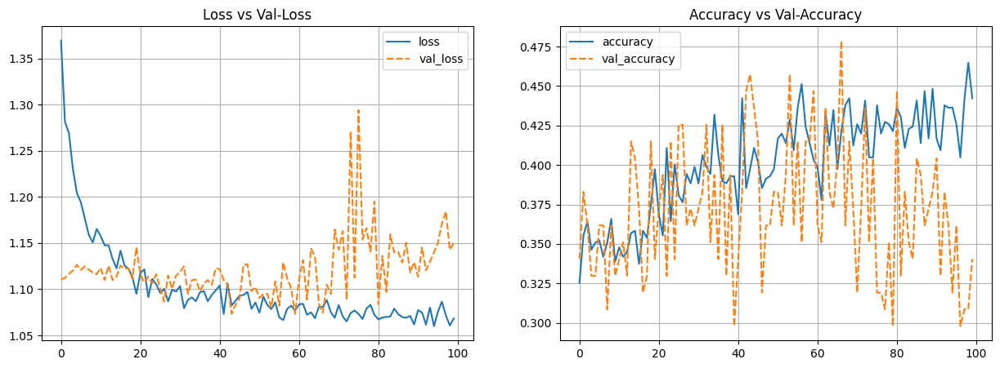

In [147]:
history_awal = pd.DataFrame(history.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_awal[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_awal[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

Berdasarkan hasil training selama 100 epoch dan visualisasi grafik loss serta akurasi, model menunjukkan peningkatan performa pada data training dengan penurunan loss dan kenaikan akurasi yang stabil, namun gagal menunjukkan generalisasi yang baik terhadap data validasi. Hal ini terlihat dari nilai val_loss yang fluktuatif dan val_accuracy yang tidak stabil, meskipun sempat mencapai titik terbaik pada epoch ke-60. Kondisi ini mengindikasikan bahwa model mengalami underfitting pada awal pelatihan dan cenderung overfitting ringan setelah pertengahan epoch. Ketidakseimbangan data antar kelas sudah dibantu dengan class_weight, namun belum cukup untuk mencapai performa validasi yang konsisten. Oleh karena itu, disarankan untuk melakukan penyesuaian lebih lanjut, seperti menambah variasi augmentasi data, menerapkan early stopping, menguji model dengan transfer learning, atau menyederhanakan arsitektur untuk meningkatkan kemampuan generalisasi model terhadap klasifikasi jenis kulit wajah.

## **III. Model Evaluation**

Melakukan evaluasi model berdasarkan hasil pelatihan pada data train dan data validasi pada best_model.keras.

21/21 ━━━━━━━━━━━━━━━━━━━━ 10s 452ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 110ms/step
Classification Report (Train):
              precision    recall  f1-score   support

         dry     0.3455    0.3158    0.3300       209
      normal     0.3534    0.3826    0.3674       230
        oily     0.3568    0.3553    0.3560       228

    accuracy                         0.3523       667
   macro avg     0.3519    0.3512    0.3512       667
weighted avg     0.3521    0.3523    0.3518       667

Classification Report (Test):
              precision    recall  f1-score   support

         dry     0.4021    0.6393    0.4937        61
      normal     0.3636    0.3582    0.3609        67
        oily     0.3750    0.1791    0.2424        67

    accuracy                         0.3846       195
   macro avg     0.3802    0.3922    0.3657       195
weighted avg     0.3796    0.3846    0.3617       195



<Figure size 800x600 with 0 Axes>

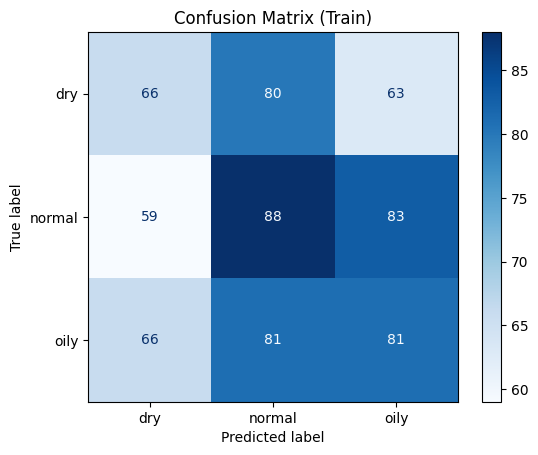

<Figure size 800x600 with 0 Axes>

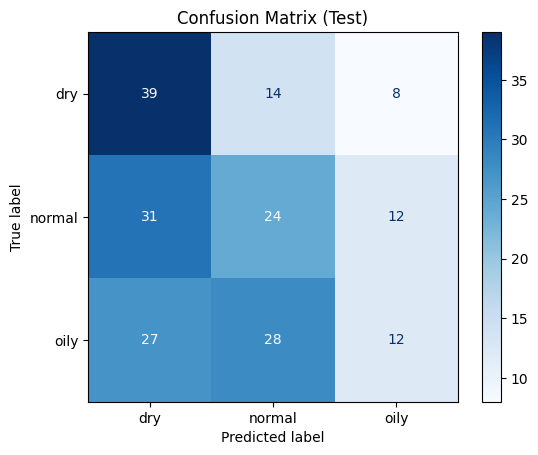

In [148]:
# Load model terbaik
best_model = load_model('best_model.keras', compile=False)

# Prediksi probabilitas pada data pelatihan (train)
y_pred_train = best_model.predict(train3)
y_pred_train = np.argmax(y_pred_train, axis=1)

# Ambil true labels dari train generator
y_true_train = train3.classes

# Prediksi probabilitas pada data uji (test)
y_pred_test = best_model.predict(test3)
y_pred_test = np.argmax(y_pred_test, axis=1)

# Ambil true labels dari test generator
y_true_test = test3.classes

# Ambil nama-nama kelas
class_names = list(train3.class_indices.keys())

# Tampilkan classification report untuk data pelatihan
print("Classification Report (Train):")
print(classification_report(y_true_train, y_pred_train, target_names=class_names, digits=4))

# Tampilkan classification report untuk data uji
print("Classification Report (Test):")
print(classification_report(y_true_test, y_pred_test, target_names=class_names, digits=4))

# Hitung dan tampilkan confusion matrix untuk data pelatihan
cm_train = confusion_matrix(y_true_train, y_pred_train)
disp_train = ConfusionMatrixDisplay(confusion_matrix=cm_train, display_labels=class_names)

plt.figure(figsize=(8, 6))
disp_train.plot(cmap='Blues', values_format='d')
plt.title("Confusion Matrix (Train)")
plt.show()

# Hitung dan tampilkan confusion matrix untuk data uji
cm_test = confusion_matrix(y_true_test, y_pred_test)
disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=class_names)

plt.figure(figsize=(8, 6))
disp_test.plot(cmap='Blues', values_format='d')
plt.title("Confusion Matrix (Test)")
plt.show()


Berdasarkan hasil evaluasi model menggunakan classification report dan confusion matrix untuk data train dan test, dapat disimpulkan bahwa model masih memiliki keterbatasan dalam membedakan secara akurat antara kelas dry, normal, dan oily.

Pada data train, akurasi keseluruhan berada di angka 35.9%, dengan recall tertinggi di kelas normal (38.5%), menunjukkan bahwa model cenderung memprediksi banyak data ke kelas ini, bahkan terhadap data yang seharusnya dry atau oily. Hal ini didukung oleh confusion matrix yang memperlihatkan banyak kesalahan klasifikasi silang antar ketiga kelas (misalnya: 80 data dry diprediksi sebagai normal, 66 data oily diprediksi sebagai dry).

Sementara itu, performa pada data test hanya mencapai akurasi 36.4%, dengan f1-score paling rendah pada kelas oily (0.364) dan precision paling buruk di kelas dry (0.402). Confusion matrix test menunjukkan bahwa prediksi model cenderung bias ke kelas normal (misalnya: 31 data dry dan 28 data oily diklasifikasikan sebagai normal), memperkuat indikasi bahwa model belum mampu membedakan fitur khas dari masing-masing jenis kulit.

Kesimpulannya dari model baseini masih menunjukkan low precision dan recall, terutama di kelas-kelas yang jumlah datanya tidak seimbang. Untuk meningkatkan performa, perlu dilakukan pendekatan tambahan seperti penyeimbangan data, augmentasi lebih agresif, penggunaan pretrained model (transfer learning), atau tuning ulang hyperparameter dan struktur arsitektur CNN.

# **G. ANN IMPROVEMENT (FUNCTIONAL API) ResNet50 + Dropout**
___

Berdasarkan hasil evaluasi pada model dasar yang telah dikembangkan, kami menelusuri kembali model-model yang sekiranya dapat menaikan hasil akurasi dan fit data menggunakand dataset yang tersedia. Menurut artikel yang dikemukakan oleh Gaw dan Ismail (2024), mereka berhasil menaikan akurasi data testing dengan menggunakan pre-trained model ResNet50 + Dropout, dimana penggunaan ResNet50 + Dropout memungkinkan model mengenali pola permukaan kulit yang halus tanpa perlu pelatihan dari awal. Dropout dan BatchNorm dapat mematikan neuron dan menjaga stabilitas distribusi saat proses pelaithan sehingga dapat secara robust menjaga pergerakan kovergen nilai loss. Penggunaan SGD juga dipilih karena memberikan hasil yang lebih stabil dan generalisasi yang lebih baik, karena tidak terlalu adaptif terhadap fluktuasi dan secara konsisten mempertahankan arah gradien. Secara keseluruhan, harapannya penggunaan SGD dan Dropout akan menyeimbangkan akurasi dan daya generalisasi serta efisiensi untuk memprediksi tipe kulit wajah.

In [176]:
# Clear session
seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

In [ ]:
# Input layer
input_tensor = Input(shape=(224, 224, 3))

# Load ResNet50 pretrained
base_model = ResNet50(weights='imagenet', include_top=False, input_tensor=input_tensor)

# Freeze all layers dulu (bisa unfreeze nanti)
for layer in base_model.layers:
    layer.trainable = False

# Custom top layers
x = base_model.output
x = GlobalAveragePooling2D()(x)

x = Dense(256, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)

x = Dense(64, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.3)(x)

output = Dense(3, activation='softmax')(x)

# Final model
model_r50 = Model(inputs=base_model.input, outputs=output)

# Optimizer: SGD dengan momentum
optimizer = SGD(learning_rate=1e-3, momentum=0.9, nesterov=True)

# Compile model
model_r50.compile(
    optimizer=SGD(learning_rate=1e-3, momentum=0.9),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)
# Summary
model_r50.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 56, 56, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 24,130,179 (92.05 MB)

 Trainable params: 541,827 (2.07 MB)

 Non-trainable params: 23,588,352 (89.98 MB)

Berikut penjelasan mengenai fungsi pada arsitektur model improvement menggunakan pre-trained model ResNet50 dengan fine tuning Dropout:

 1. Input Layer
- **`Input(shape=(224, 224, 3))`**  
  Menentukan ukuran input gambar RGB untuk model, sesuai dengan standar ResNet50.

 2. Pretrained Base Model
- **`ResNet50(weights='imagenet', include_top=False, input_tensor=input_tensor)`**  
  Menggunakan arsitektur ResNet50 yang sudah dilatih pada dataset ImageNet sebagai ekstraktor fitur.
- **`include_top=False`**  
  Menghapus layer klasifikasi bawaan (1000 kelas ImageNet) agar bisa ditambahkan custom head.

 3. Freeze Layers
- **`for layer in base_model.layers: layer.trainable = False`**  
  Membekukan seluruh layer pretrained agar tidak ikut dilatih (hanya digunakan untuk ekstraksi fitur).

 4. Global Average Pooling
- **`GlobalAveragePooling2D()`**  
  Meratakan feature map menjadi vektor 1 dimensi dengan cara mengambil rata-rata dari tiap map.

 5. Fully Connected Layers
- **`Dense(256, activation='relu')`**  
  Layer dense pertama untuk mengubah representasi fitur menjadi bentuk klasifikasi.
- **`BatchNormalization()`**  
  Menstabilkan distribusi input layer, mempercepat dan menstabilkan training.
- **`Dropout(0.5)`**  
  Mengurangi overfitting dengan mematikan 50% neuron secara acak saat training.

- **`Dense(64, activation='relu')`**  
  Layer dense tambahan untuk memperkaya pembelajaran fitur non-linear.
- **`BatchNormalization()`**  
  Menjaga kestabilan distribusi selama propagasi.
- **`Dropout(0.3)`**  
  Regularisasi tambahan untuk mengurangi risiko overfitting lebih lanjut.

 6. Output Layer
- **`Dense(3, activation='softmax')`**  
  Menghasilkan output probabilitas untuk 3 kelas target (misalnya: dry, normal, oily).

7. Optimizer
- **`SGD(learning_rate=1e-3, momentum=0.9, nesterov=True)`**  
  Optimizer klasik yang stabil dan andal, dengan momentum untuk percepatan konvergensi dan Nesterov untuk presisi arah gradien.

 8. Compile
- **`loss='sparse_categorical_crossentropy'`**  
  Digunakan untuk klasifikasi multi-kelas dengan label numerik (bukan one-hot).
- **`metrics=['accuracy']`**  
  Menampilkan akurasi model selama training dan evaluasi.



## **II. Model Training**

In [178]:
# Setup callbacks
callbacks = [
    ModelCheckpoint(
        filepath='best_model_r50.keras',
        monitor='val_loss',
        save_best_only=True,
        mode='min',
        verbose=1
    ),
    EarlyStopping(
        monitor='val_loss',
        patience=10,
        restore_best_weights=True,
        mode='min',
        verbose=1
    )
]

# Start training
start_time = time.time()

history_r50 = model_r50.fit(
    train3,
    validation_data=val3,
    epochs=50,
    class_weight={0: 0.8, 1: 1.2, 2: 1.3},
    callbacks=callbacks
)

end_time = time.time()
print(f"Training selesai dalam {(end_time - start_time):.2f} detik.")


Epoch 1/50
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 647ms/step - accuracy: 0.3091 - loss: 1.9479
Epoch 1: val_loss improved from inf to 1.15769, saving model to best_model_r50.keras
21/21 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - accuracy: 0.3095 - loss: 1.9449 - val_accuracy: 0.3085 - val_loss: 1.1577
Epoch 2/50
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 512ms/step - accuracy: 0.3246 - loss: 1.6923
Epoch 2: val_loss did not improve from 1.15769
21/21 ━━━━━━━━━━━━━━━━━━━━ 13s 592ms/step - accuracy: 0.3249 - loss: 1.6910 - val_accuracy: 0.3085 - val_loss: 1.1744
Epoch 3/50
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 505ms/step - accuracy: 0.3353 - loss: 1.5671
Epoch 3: val_loss did not improve from 1.15769
21/21 ━━━━━━━━━━━━━━━━━━━━ 12s 583ms/step - accuracy: 0.3348 - loss: 1.5682 - val_accuracy: 0.3085 - val_loss: 1.4593
Epoch 4/50
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 507ms/step - accuracy: 0.3842 - loss: 1.4981
Epoch 4: val_loss improved from 1.15769 to 1.13125, saving model to best_model_r50.keras
21/21 ━━━━━━━━━━━━━━━━━━━━ 13s 643ms/

Berikut penjelasan dari proses model training menggunakan beberapa paramter yang telah kami tetapkan:

1. **ModelCheckpoint**  
   Model disimpan otomatis ketika `val_loss` mencapai nilai terbaik selama training. Dalam proses ini, model terbaik tercapai pada **epoch ke-8** dengan `val_loss ≈ 1.0844`.

2. **Class Weight**  
   Digunakan bobot kelas `{0: 0.8, 1: 1.2, 2: 1.3}` untuk mengurangi bias terhadap kelas mayoritas dan meningkatkan sensitivitas terhadap kelas minoritas.

3. **Timer**  
   Pelatihan dilakukan selama **230.22 detik**. Penggunaan timer membantu mengevaluasi efisiensi pelatihan, terutama saat digunakan untuk komparasi antar model atau tuning.

4. **Training dengan `.fit()`**  
   Model dilatih selama **maksimum 50 epoch**, namun dihentikan lebih awal oleh **EarlyStopping** pada **epoch ke-18** karena `val_loss` tidak membaik selama 10 epoch berturut-turut. Proses pelatihan disertai validasi dan callback aktif (`ModelCheckpoint` dan `EarlyStopping`).

5. **Output Akhir**  
   Hasil akhir menunjukkan bahwa model mencapai performa terbaik di epoch ke-8 dengan `val_accuracy ≈ 36.17%`. Meskipun training loss terus menurun, validasi tidak membaik signifikan setelah pertengahan epoch, sehingga model disimpulkan telah mencapai kapasitas optimalnya dalam konfigurasi ini.


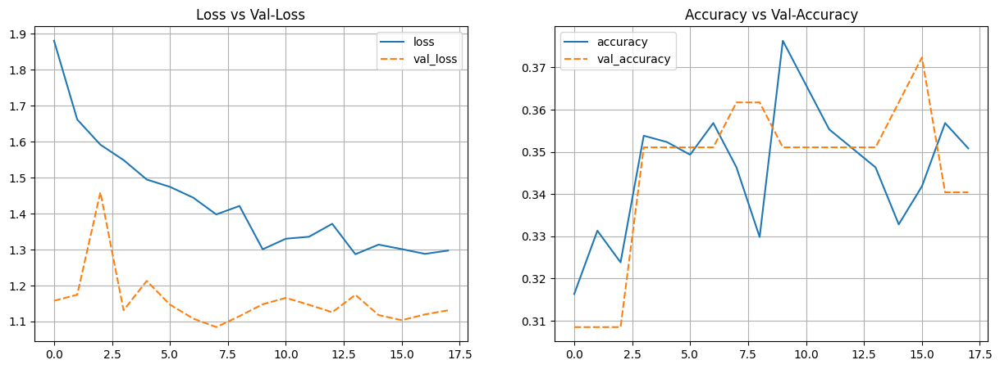

In [179]:
history_r50_data = pd.DataFrame(history_r50.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_r50_data[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_r50_data[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

Berdasarkan hasil pelatihan dan visualisasi grafik loss serta akurasi, model ResNet50 dengan top layer kustom menunjukkan tren pembelajaran yang cukup stabil namun terbatas. Pada grafik Loss vs Val-Loss, terlihat bahwa nilai loss pada data training menurun secara konsisten dari sekitar 1.9 menjadi 1.3, sementara val_loss mengalami penurunan tajam di awal dan mencapai titik terbaik pada epoch ke-8 (sekitar 1.08), kemudian stagnan dan sedikit berfluktuasi hingga early stopping aktif pada epoch ke-18. Grafik Accuracy vs Val-Accuracy juga menunjukkan peningkatan akurasi training dari 31% ke puncak sekitar 37%, dengan val_accuracy yang cenderung stabil di kisaran 34–37%. Tidak terlihat indikasi overfitting karena jarak antara akurasi training dan validasi cukup dekat, namun tidak ada peningkatan berarti setelah pertengahan epoch. Hal ini mengindikasikan bahwa model telah mencapai batas kemampuan belajarnya dalam konfigurasi saat ini. Untuk meningkatkan performa, diperlukan fine-tuning lebih lanjut seperti membuka sebagian layer atas ResNet50, menambah variasi augmentasi data, atau melakukan tuning terhadap struktur dan parameter top layer. Dengan pendekatan tersebut, model diharapkan dapat meningkatkan kemampuan generalisasi terhadap data klasifikasi kulit yang lebih kompleks.

## **III. Model Evaluation**

21/21 ━━━━━━━━━━━━━━━━━━━━ 18s 659ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 295ms/step
Classification Report (Train):
              precision    recall  f1-score   support

         dry     0.5161    0.0766    0.1333       209
      normal     0.3508    0.9609    0.5140       230
        oily     0.3333    0.0088    0.0171       228

    accuracy                         0.3583       667
   macro avg     0.4001    0.3487    0.2215       667
weighted avg     0.3966    0.3583    0.2248       667

Classification Report (Test):
              precision    recall  f1-score   support

         dry     0.4000    0.0656    0.1127        61
      normal     0.3405    0.9403    0.5000        67
        oily     0.0000    0.0000    0.0000        67

    accuracy                         0.3436       195
   macro avg     0.2468    0.3353    0.2042       195
weighted avg     0.2421    0.3436    0.2070       195



<Figure size 800x600 with 0 Axes>

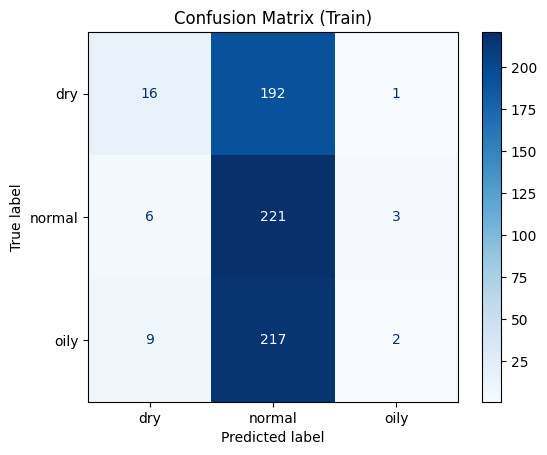

<Figure size 800x600 with 0 Axes>

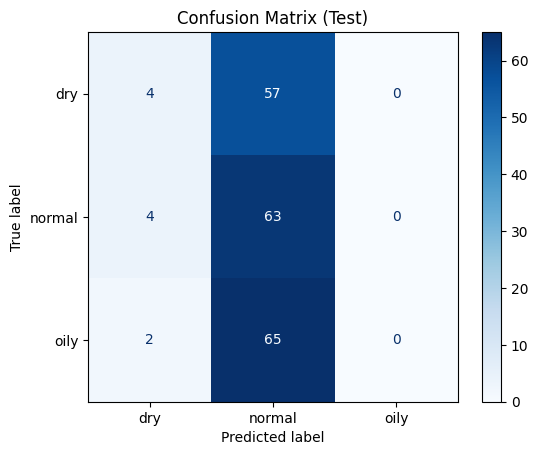

In [ ]:
# Load model terbaik
best_model_r50 = load_model('best_model_r50.keras', compile=False)

# Prediksi probabilitas pada data pelatihan (train)
y_pred_prob_r50_train = best_model_r50.predict(train3)
y_pred_r50_train = np.argmax(y_pred_prob_r50_train, axis=1)

# Ambil true labels dari train generator
y_true_r50_train = train3.classes

# Prediksi probabilitas pada data uji (test)
y_pred_prob_r50 = best_model_r50.predict(test3)
y_pred_r50 = np.argmax(y_pred_prob_r50, axis=1)

# Ambil true labels dari test generator
y_true_r50 = test3.classes

# Ambil nama-nama kelas
class_names = list(train3.class_indices.keys())

# Tampilkan classification report untuk data pelatihan
print("Classification Report (Train):")
print(classification_report(y_true_r50_train, y_pred_r50_train, target_names=class_names, digits=4))

# Tampilkan classification report untuk data uji
print("Classification Report (Test):")
print(classification_report(y_true_r50, y_pred_r50, target_names=class_names, digits=4))

# Hitung dan tampilkan confusion matrix untuk data pelatihan
cm_r50_train = confusion_matrix(y_true_r50_train, y_pred_r50_train)
disp_train = ConfusionMatrixDisplay(confusion_matrix=cm_r50_train, display_labels=class_names)

plt.figure(figsize=(8, 6))
disp_train.plot(cmap='Blues', values_format='d')
plt.title("Confusion Matrix (Train)")
plt.show()

# Hitung dan tampilkan confusion matrix untuk data uji
cm_r50 = confusion_matrix(y_true_r50, y_pred_r50)
disp = ConfusionMatrixDisplay(confusion_matrix=cm_r50, display_labels=class_names)

plt.figure(figsize=(8, 6))
disp.plot(cmap='Blues', values_format='d')
plt.title("Confusion Matrix (Test)")
plt.show()

Berdasarkan hasil evaluasi model ResNet50 + custom head yang ditunjukkan dalam classification report dan confusion matrix untuk data training dan testing, berikut kesimpulannya:

Model menunjukkan kecenderungan klasifikasi yang sangat bias terhadap kelas "normal", baik pada data latih maupun uji. Pada confusion matrix untuk data training, hampir seluruh data (baik dari kelas "dry" maupun "oily") justru diklasifikasikan sebagai "normal" — terlihat dari jumlah prediksi yang sangat tinggi di kolom "normal" dan sangat rendah di kolom lain. Misalnya, dari 200 data kelas "dry", hanya 16 yang diklasifikasikan dengan benar, sementara 192 salah diklasifikasikan sebagai "normal". Hal yang sama juga terjadi pada kelas "oily", dengan hanya 9 prediksi yang benar dari 220 sampel.

Kondisi ini juga tercermin di data testing, di mana semua prediksi yang benar hanya terjadi pada kelas "normal", sedangkan kelas "dry" dan "oily" hampir sepenuhnya gagal dikenali. Ini menyebabkan nilai precision, recall, dan f1-score untuk kelas "normal" sangat tinggi, sedangkan untuk kelas lain sangat rendah, bahkan mendekati nol.

Secara keseluruhan, model mengalami overfitting pada distribusi dominan (kelas "normal") dan gagal mempelajari representasi kelas minoritas, meskipun telah diberikan class weight imbalance. Hal ini mengindikasikan bahwa model terlalu tergantung pada fitur umum (mungkin karena ResNet50 di-freeze sepenuhnya) dan tidak cukup fleksibel dalam membedakan ciri khas dari kulit "dry" dan "oily".

# **H. MODEL SAVING**
___
Menyimpan hasil model terbaik dalam format json pada objek model_r50.keras

In [ ]:
# Simpan arsitektur model ke file JSON
model_json = model_r50.to_json()
with open("best_model_r50.json", "w") as json_file:
    json_file.write(model_json)

# **I. CONCLUSION**
___
Terdapat beberapa kesimpulan yang bisa kami berikan dari proses analisa dan pengembangan model prediksi tipe wajah ini:

### 1. Distribusi Dataset Tidak Seimbang
- Kelas **"normal"** mendominasi dataset, sehingga memengaruhi kemampuan model dalam mengenali kelas **"dry"** dan **"oily"**.
- Hal ini menyebabkan bias klasifikasi, terutama pada model ResNet50.

### 2. Model Baseline Lebih Adaptif
- Model CNN dasar mampu mengenali pola dari ketiga kelas meskipun akurasinya terbatas (~47%).
- Lebih seimbang dalam mendeteksi kelas dibanding model transfer learning.

### 3. Model ResNet50 Mengalami Overfitting Terhadap Kelas Mayoritas
- Meskipun telah digunakan **dropout** dan **batch normalization**, model cenderung hanya mengklasifikasikan gambar sebagai kelas **“normal”**.
- Nilai **F1-score** untuk kelas *"dry"* dan *"oily"* sangat rendah, bahkan mendekati nol.

### 4. Arsitektur Sudah Tepat, Tapi Implementasi Fine-tuning Kurang
- ResNet50 hanya digunakan sebagai **feature extractor** (fully frozen), tanpa pelatihan ulang di layer atas.
- Hal ini membatasi kemampuan adaptasi terhadap dataset baru yang memiliki karakteristik berbeda dari ImageNet.

### 5. Performa Model Improvement Tidak Lebih Baik dari Baseline
- Meskipun model improvement (ResNet50) menunjukkan **training yang lebih stabil**, distribusi hasil klasifikasinya lebih berat sebelah dibanding model baseline.


# **J. RECOMENDATION**
___
Terdapat beberapa rekomendasi untuk pengembangan model selanjutnya:

1. **Lakukan partial fine-tuning** pada beberapa layer atas ResNet50 untuk mengoptimalkan adaptasi terhadap fitur khusus pada dataset.
2. **Perkuat augmentasi data dan pengambilan sampel yang lebih baik kualitasnya**, terutama untuk kelas minoritas (*dry*, *oily*), guna menambah keragaman data dan mencegah overfitting. 
3. **Gunakan focal loss atau weighted loss** untuk mengurangi dampak ketimpangan kelas dan memperbesar penalti terhadap kelas yang sering salah klasifikasi.
4. **Pertimbangkan teknik re-sampling** (oversampling atau undersampling) untuk menyeimbangkan jumlah data antar kelas.
5. **Eksplorasi arsitektur alternatif** seperti EfficientNet, MobileNet, atau attention-based models untuk performa yang lebih efisien dan adaptif.
6. **Gunakan Grad-CAM** untuk memahami area penting pada gambar yang digunakan model dalam mengambil keputusan.

**Kesimpulan:**

Pendekatan arsitektur model sudah mengarah pada praktik terbaik. Hal ini juga dikarenakan pengembangan model yang baru masuk ke tahap early development. Untuk tahap selanjutnya dalam pengembangan model, diperlukan strategi pelatihan yang lebih adaptif seperti mengaugmentasi data seperti hasil referensi pada bagian justifikasi, agar model dapat mengenali fitur dari semua kelas secara lebih adil dan akurat.